# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine


Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [3]:
'''
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X, km=None, num_clusters=0):
    color = 'brgcmyk'  # List colors
    alpha = 0.5  # color opacity
    s = 20
    plt.figure(figsize=(8, 6))  # Create a new figure for each call to display_cluster
    if num_clusters == 0:
        plt.scatter(X[:, 0], X[:, 1], c=color[0], alpha=alpha, s=s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_ == i, 0], X[km.labels_ == i, 1], c=color[i], alpha=alpha, s=s)
            plt.scatter(km.cluster_centers_[i][0], km.cluster_centers_[i][1], c=color[i], marker='x', s=100)
'''
def display_cluster(X, km=[], num_clusters=0):
    color = 'brgcmyk'  # List colors
    alpha = 0.5  # Color opacity
    s = 20  # Marker size
    
    num_dimensions = X.shape[1]
    fig, axes = plt.subplots(num_dimensions, num_dimensions, figsize=(15, 15))
    
    for i in range(num_dimensions):
        for j in range(num_dimensions):
            ax = axes[i, j]
            if i == j:
                ax.set_visible(False)
            elif i < j:
                ax.scatter(X[:, j], X[:, i], c=color[0], alpha=alpha, s=s)
                if num_clusters > 0:
                    for k in range(num_clusters):
                        ax.scatter(X[km == k, j], X[km == k, i], c=color[k], alpha=alpha, s=s)
                ax.set_xlabel(f'Dimension {j+1}')
                ax.set_ylabel(f'Dimension {i+1}')
            else:
                ax.set_visible(False)
    
    plt.tight_layout()
    plt.show()



## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



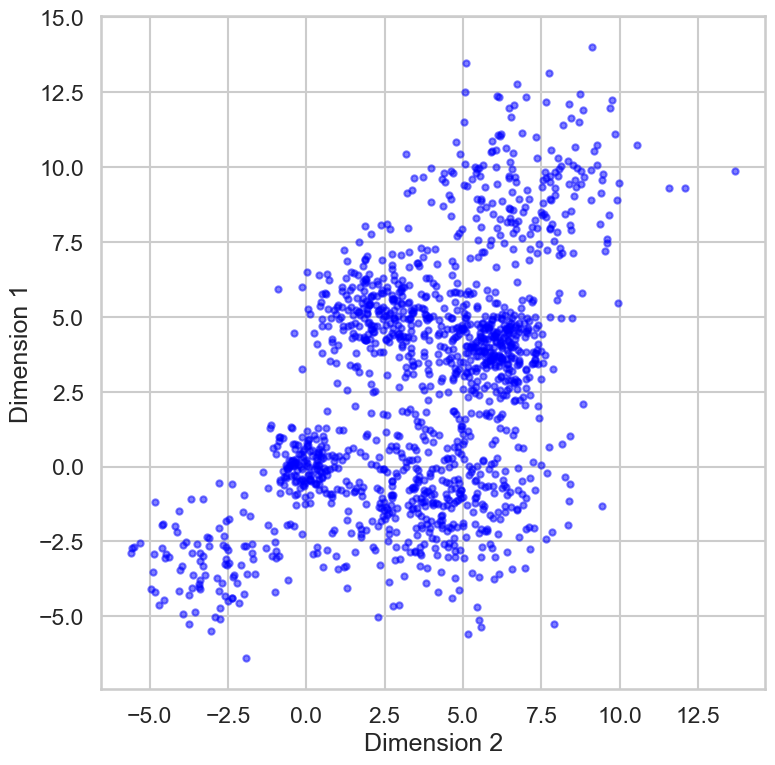

In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

range(2, 8)


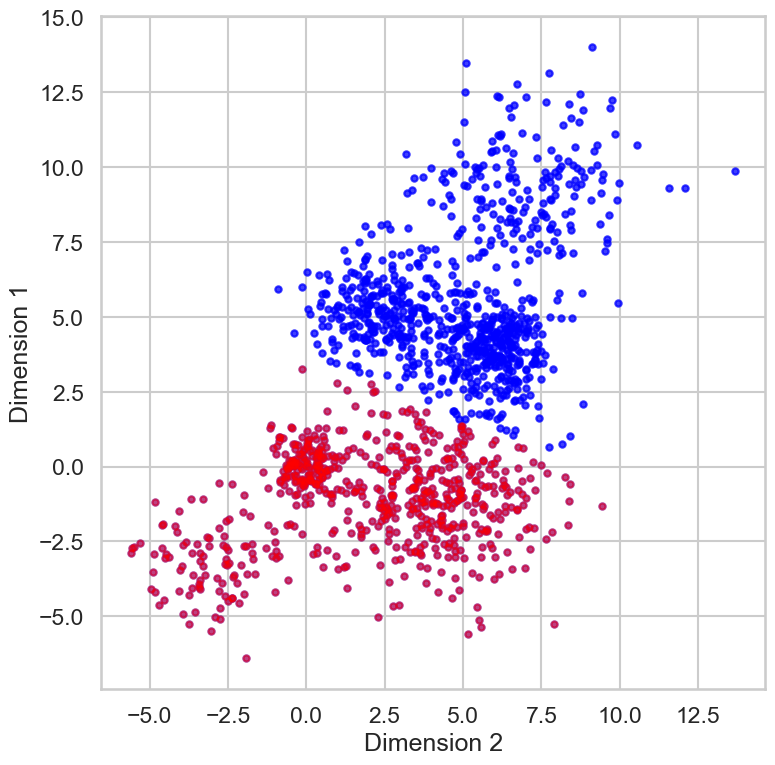

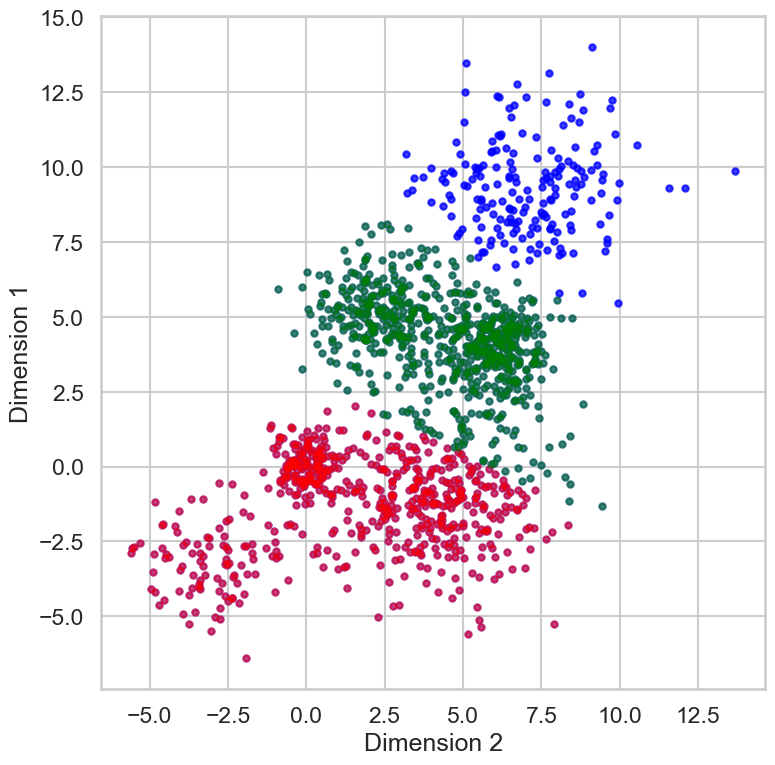

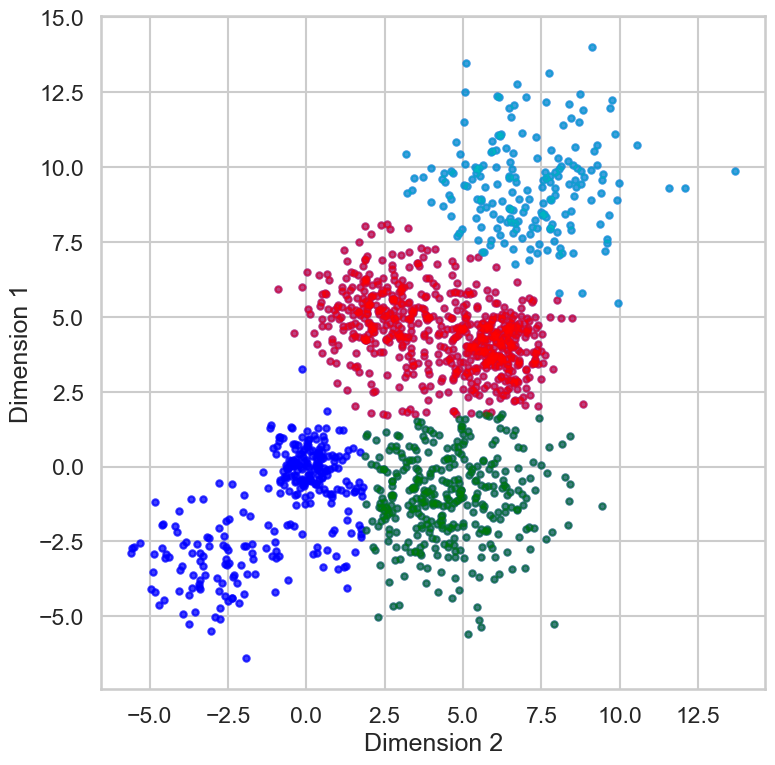

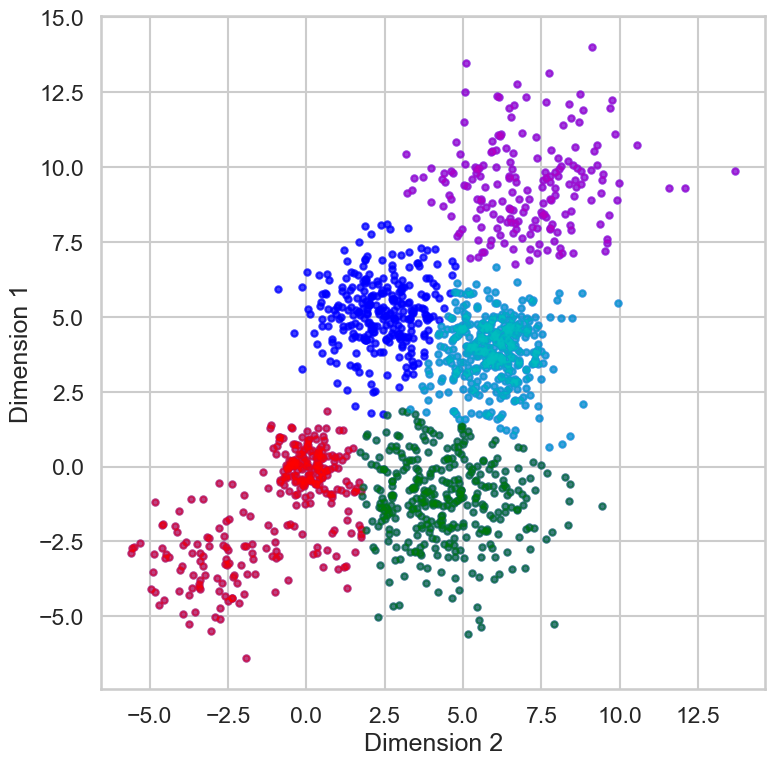

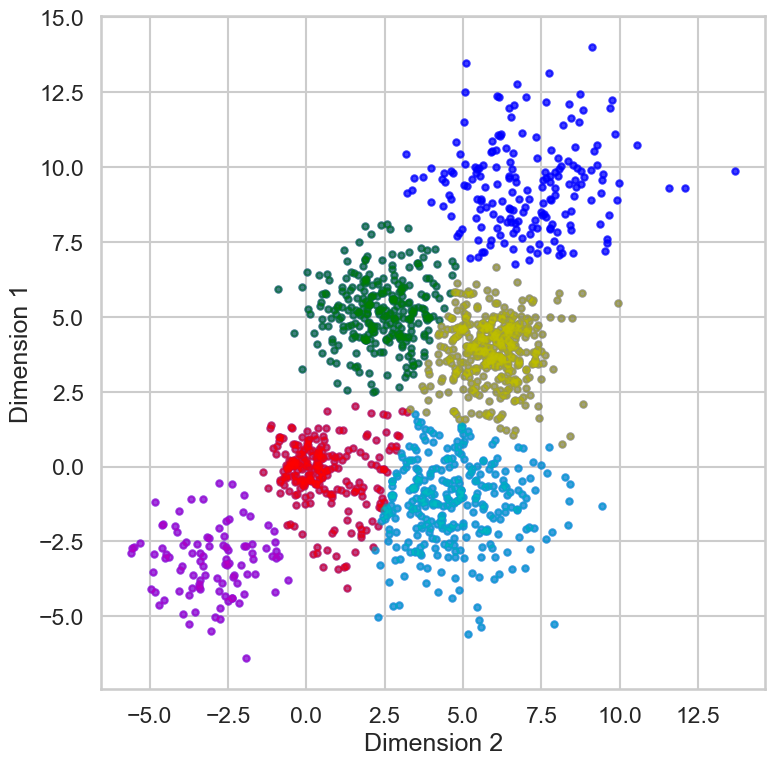

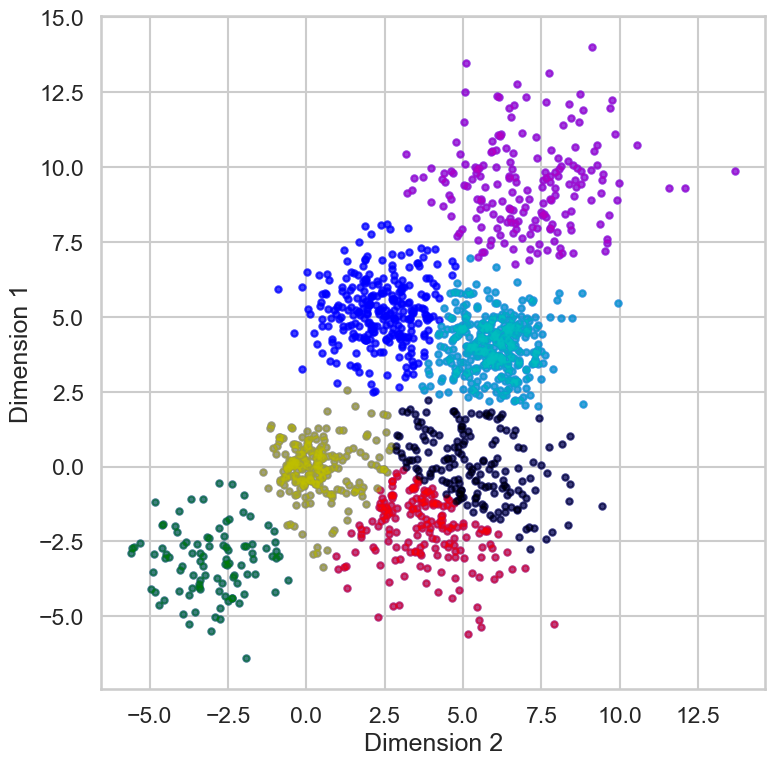

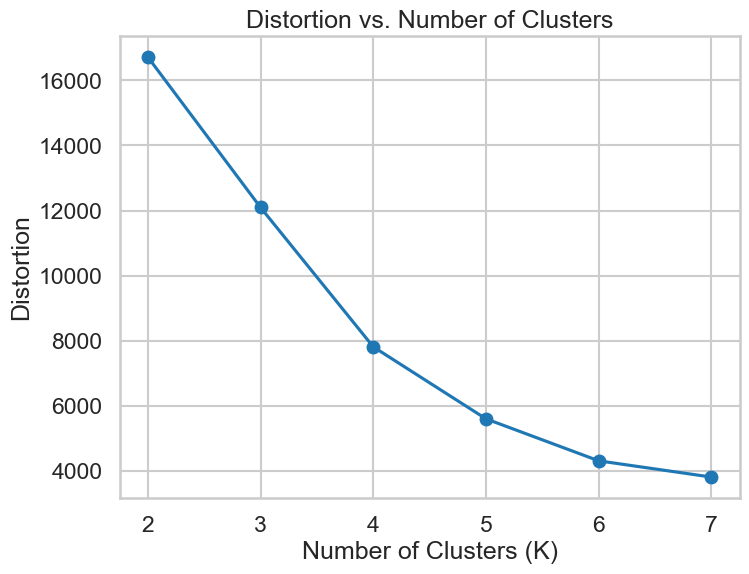

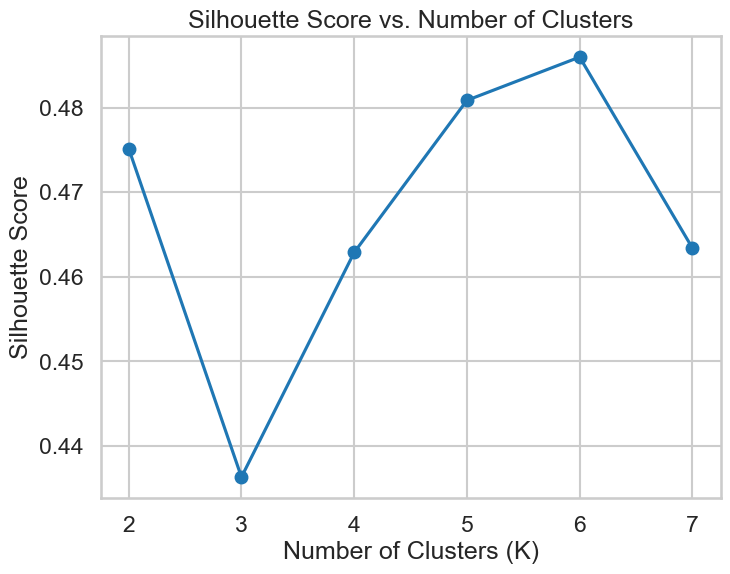

Best K: 6
Silhouette Score for Best K: 0.4859737366910219


In [5]:
k_values = range(2, 8)
distortions = []
silhouette_scores = []
print(k_values)
for k in range(2, 8):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(Multi_blob_Data)
    display_cluster(Multi_blob_Data,cluster_labels,num_clusters=k)
    distortions.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
    silhouette_scores.append(silhouette_avg)
plt.figure(figsize=(8, 6))
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.xticks(k_values)
plt.grid(True)
plt.show()
#By using elbow point 4 clusters is approriate value of k
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print("Best K:", best_k)
best_silhouette_score = max(silhouette_scores)
print("Silhouette Score for Best K:", best_silhouette_score)

    


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

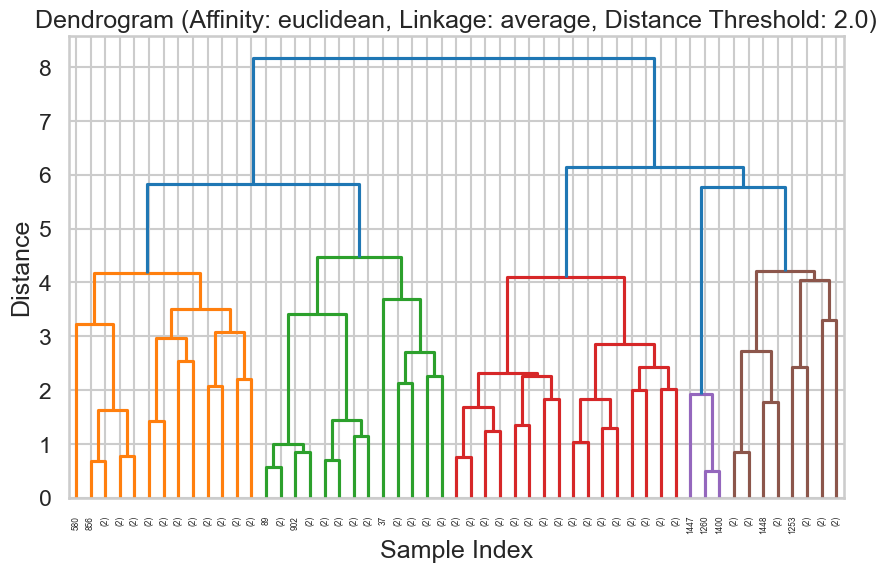

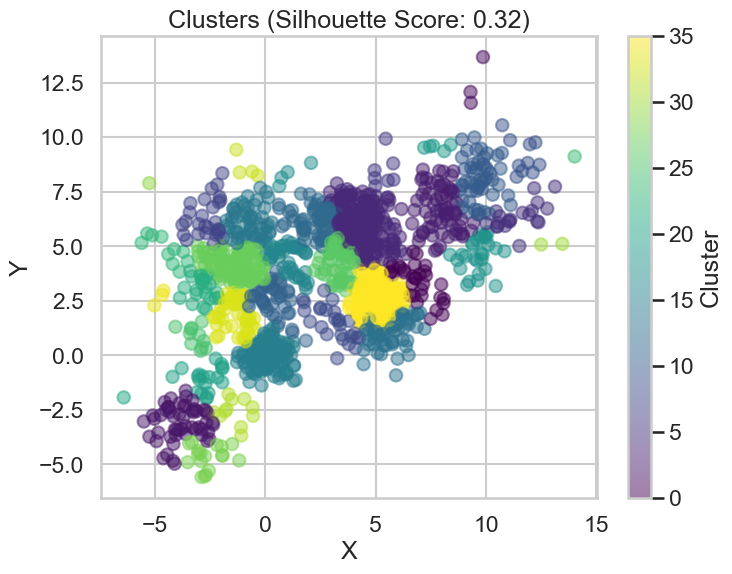

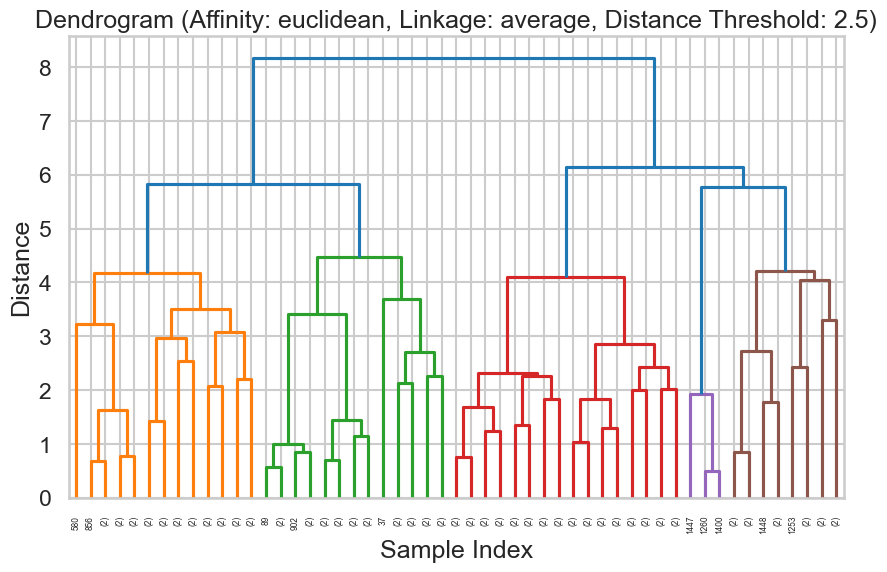

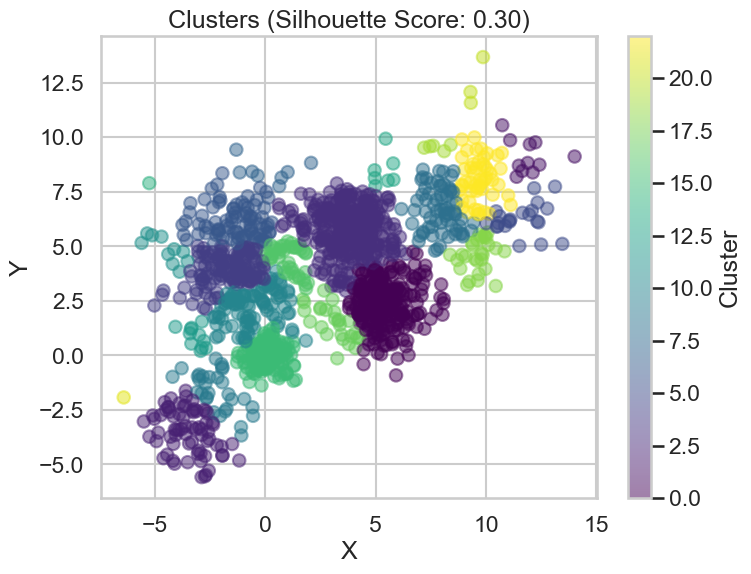

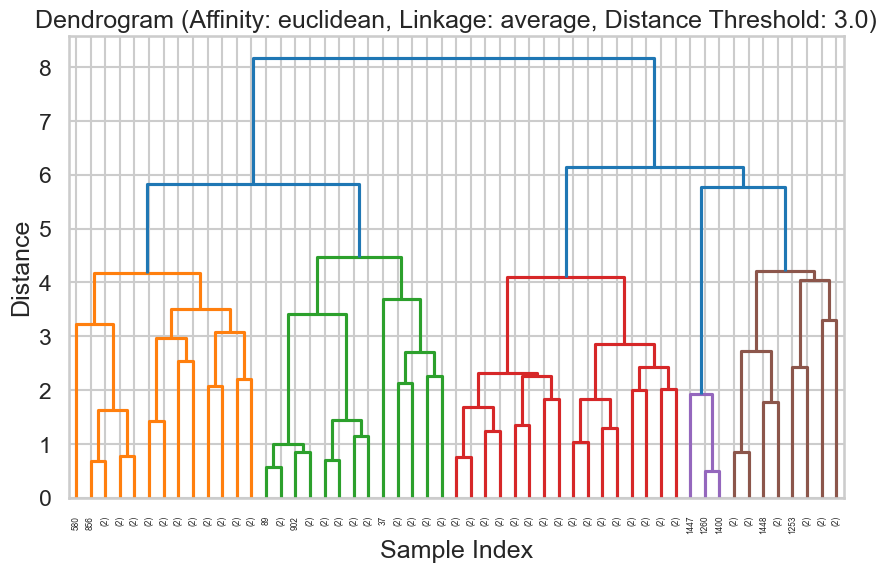

...

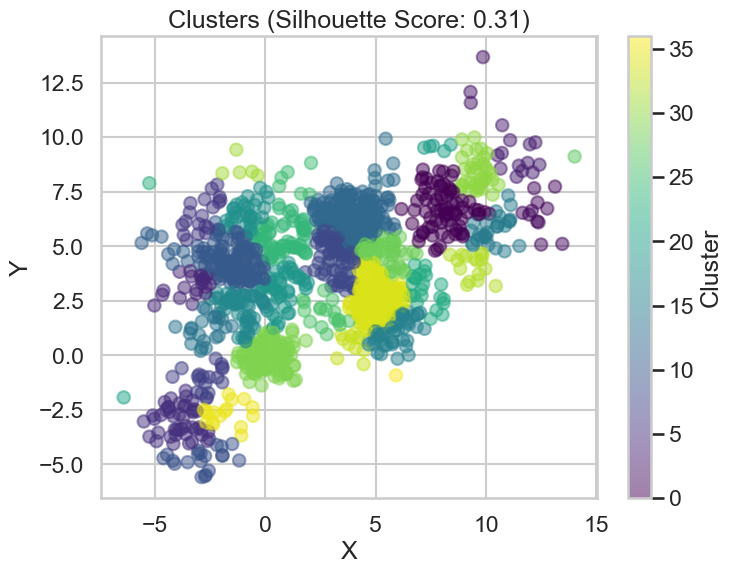

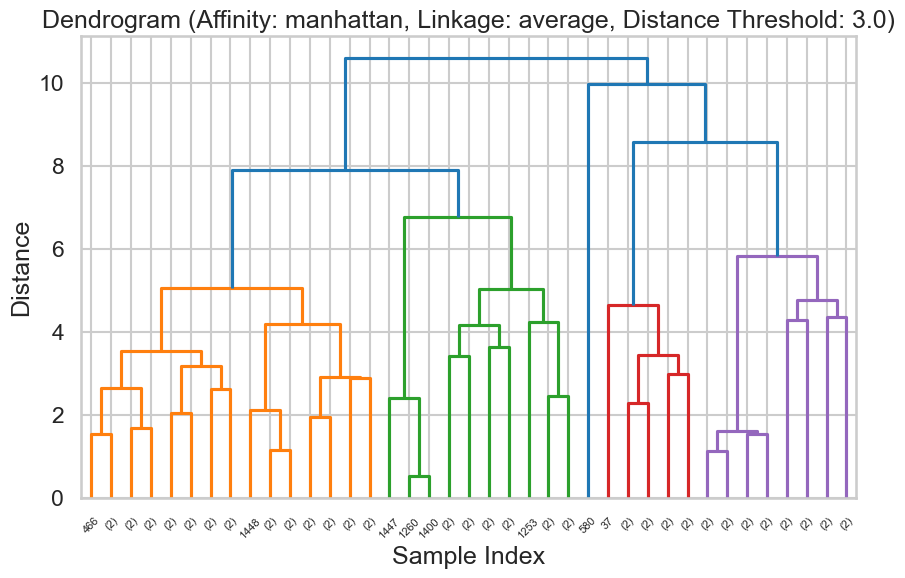

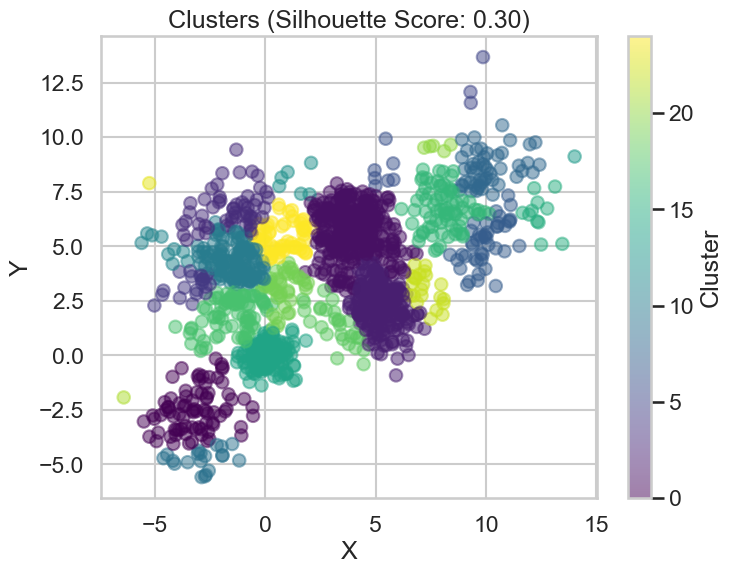

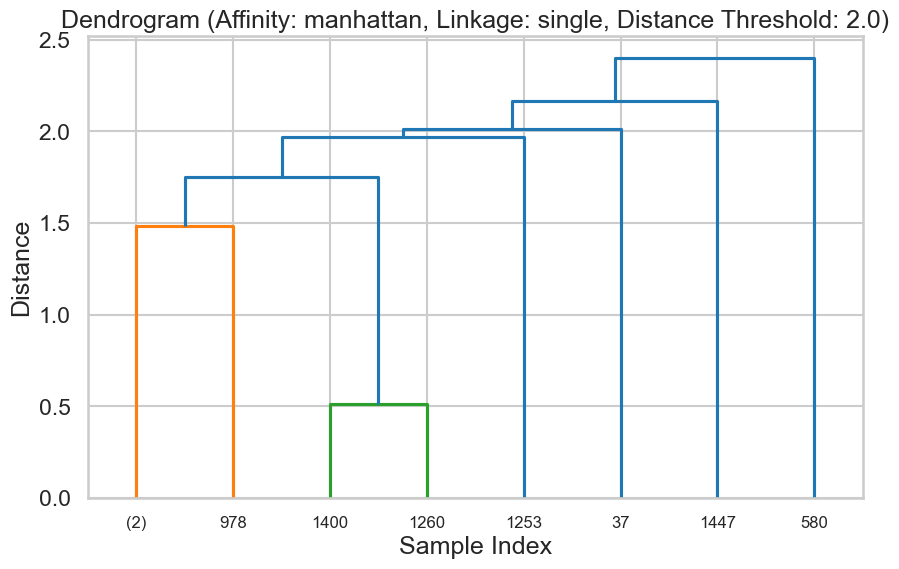

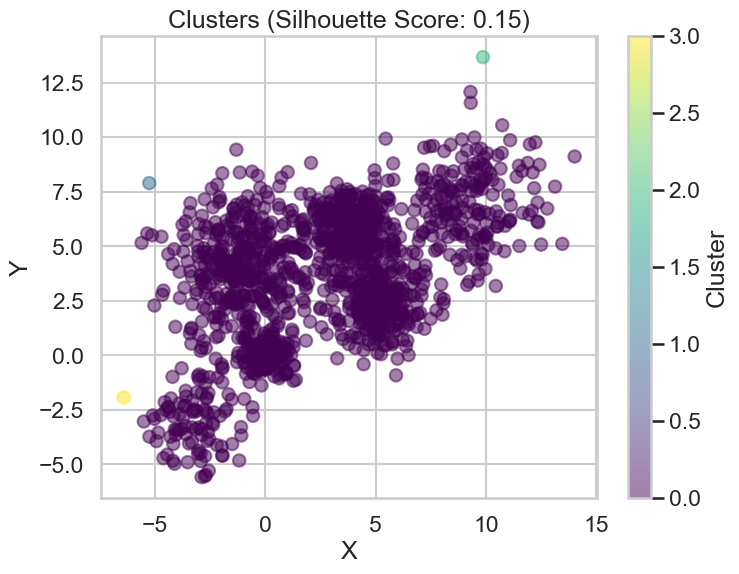

Best Silhouette Score: 0.35500586075131524
Best Parameters: ('euclidean', 'average', 3.0)


In [6]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score
import numpy as np

def plot_dendrogram(model, **kwargs):
    counts = []
    for i, merge in enumerate(model.children_):
        current_count = len(merge)
        counts.append(current_count)
        
    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    dendrogram(linkage_matrix, **kwargs)

def evaluate_agglomerative_clustering(X, affinity, linkage, distance_threshold=None):
    hierarchical = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
    cluster_labels = hierarchical.fit_predict(X)
    num_labels = len(np.unique(cluster_labels))
    if num_labels <= 1 or num_labels >= len(X):
        return -1  

    silhouette_avg = silhouette_score(X, cluster_labels)


    plt.figure(figsize=(10, 6))
    plot_dendrogram(hierarchical, truncate_mode='level', p=5)
    plt.title(f'Dendrogram (Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold})')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    plt.show()

    # Plot resulting clusters
    plt.figure(figsize=(8, 6))
    #display_cluster(Multi_blob_Data, best_cluster_labels)
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis', alpha=0.5)
    plt.title(f'Clusters (Silhouette Score: {silhouette_avg:.2f})')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.colorbar(label='Cluster')
    plt.show()

    return silhouette_avg

# Try different parameter combinations
parameter_combinations = [
    ('euclidean', 'average', 2.0),
    ('euclidean', 'average', 2.5),
    ('euclidean', 'average', 3.0),
    ('euclidean', 'single', 2.0),
    ('euclidean', 'single', 2.5),
    ('euclidean', 'single', 3.0),
    ('manhattan', 'average', 2.0),
    ('manhattan', 'average', 2.5),
    ('manhattan', 'average', 3.0),
    ('manhattan', 'single', 2.0),
    ('manhattan', 'single', 2.5),
    ('manhattan', 'single', 3.0),
    ('cosine', 'average', 2.0),
    ('cosine', 'average', 2.5),
    ('cosine', 'average', 3.0),
    ('cosine', 'single', 2.0),
    ('cosine', 'single', 2.5),
    ('cosine', 'single', 3.0)
]

best_silhouette_score = -1
best_parameters = None

for affinity, linkage, distance_threshold in parameter_combinations:
    silhouette_avg_current = evaluate_agglomerative_clustering(Multi_blob_Data, affinity, linkage, distance_threshold)

    if silhouette_avg_current < 0:
        continue
    
    if silhouette_avg_current > best_silhouette_score:
        best_silhouette_score = silhouette_avg_current
        best_parameters = (affinity, linkage, distance_threshold)

print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)


### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

Best Silhouette Score: 0.4685207355522043
Best Parameters: (2.0842105263157893, 5)


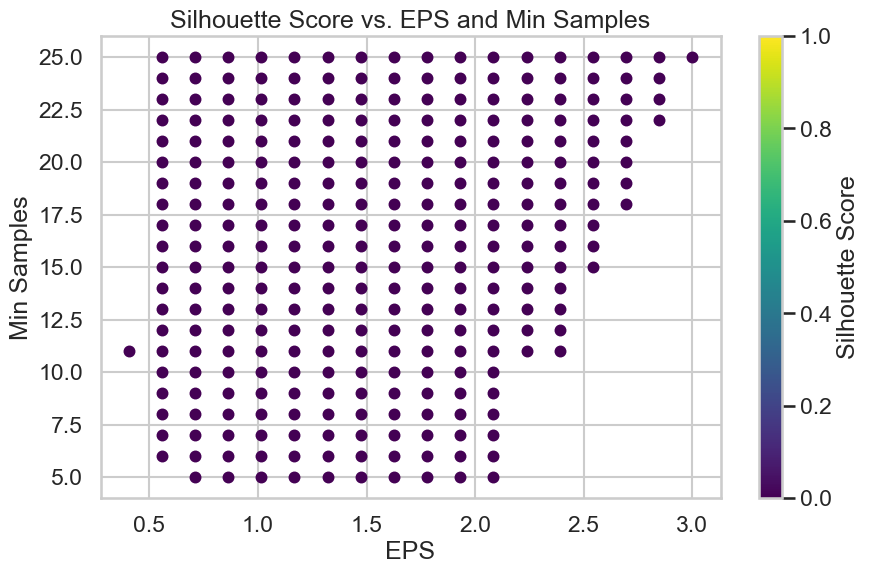

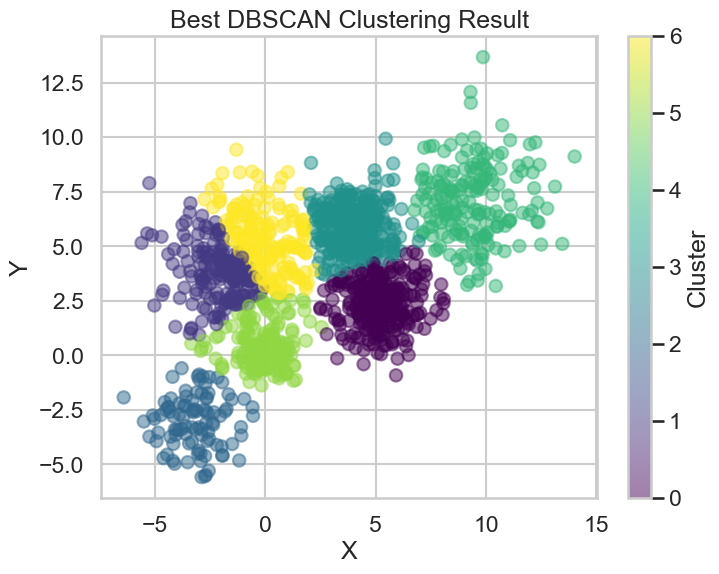

<Figure size 800x600 with 0 Axes>

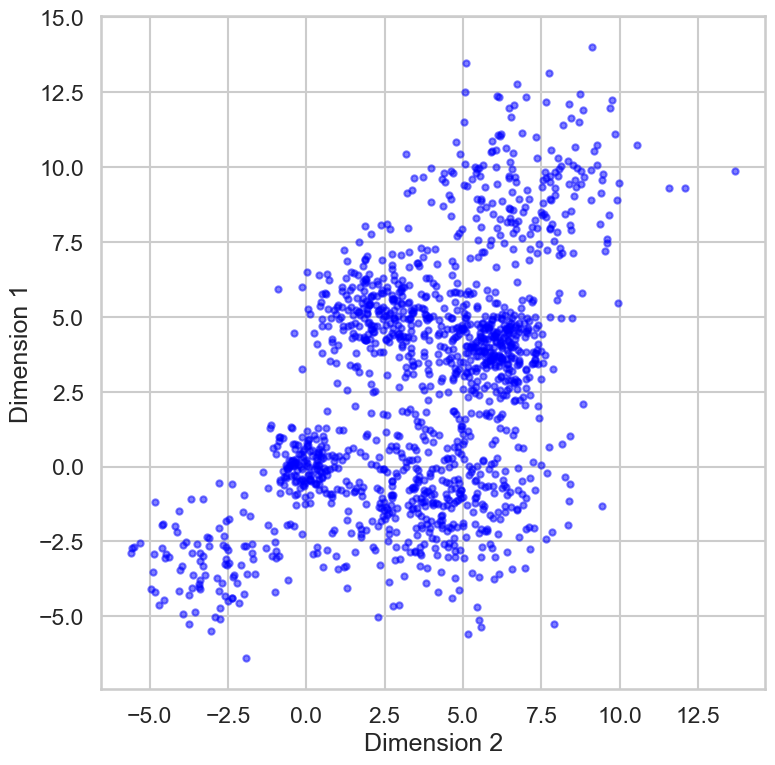

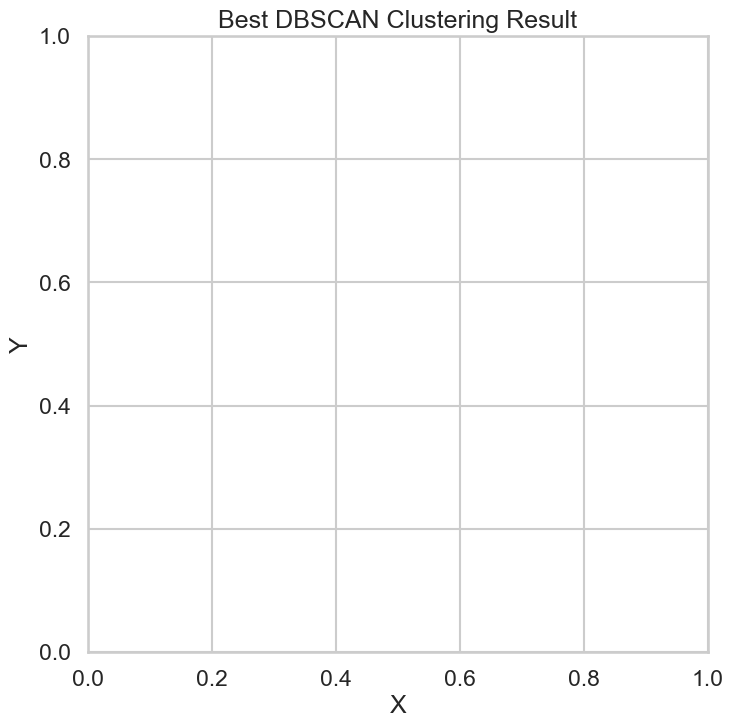

In [7]:
def evaluate_dbscan_clustering(X, eps, min_samples):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = dbscan.fit_predict(X)
    num_labels = len(np.unique(cluster_labels))
    if num_labels <= 1 or num_labels >= len(X):
        return -1  
    silhouette_avg = silhouette_score(X, cluster_labels)
    return silhouette_avg


eps_values = np.linspace(0.1, 3, 20)
min_samples_values = np.arange(5, 26)

best_silhouette_score = -1
best_parameters = None


silhouette_scores = []


for eps in eps_values:
    for min_samples in min_samples_values:
        silhouette_avg_current = evaluate_dbscan_clustering(Multi_blob_Data, eps, min_samples)
        
        
        if silhouette_avg_current < 0:
            continue
        
        
        silhouette_scores.append((eps, min_samples, silhouette_avg_current))
        
        
        if silhouette_avg_current > best_silhouette_score:
            best_silhouette_score = silhouette_avg_current
            best_parameters = (eps, min_samples)
            best_cluster_labels = cluster_labels
print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)


fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Silhouette Score vs. EPS and Min Samples')
ax.set_xlabel('EPS')
ax.set_ylabel('Min Samples')
for eps, min_samples, silhouette_avg in silhouette_scores:
    ax.scatter(eps, min_samples, c=silhouette_avg, cmap='viridis', s=50)
cbar = plt.colorbar(ax.scatter([], [], c=[], cmap='viridis'), ax=ax, label='Silhouette Score')
plt.show()
plt.figure(figsize=(8, 6))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=best_cluster_labels, cmap='viridis', alpha=0.5)
plt.title('Best DBSCAN Clustering Result')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(label='Cluster')
plt.show()
# Plot best clustering result
plt.figure(figsize=(8, 6))
display_cluster(Multi_blob_Data, best_cluster_labels)
plt.title('Best DBSCAN Clustering Result')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()



### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [8]:
from sklearn.datasets import load_iris
iris_data = load_iris()
X = iris_data.data
print(X)
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
#['setosa', 'versicolor', 'virginica']


[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]
 [5.4 3.7 1.5 0.2]
 [4.8 3.4 1.6 0.2]
 [4.8 3.  1.4 0.1]
 [4.3 3.  1.1 0.1]
 [5.8 4.  1.2 0.2]
 [5.7 4.4 1.5 0.4]
 [5.4 3.9 1.3 0.4]
 [5.1 3.5 1.4 0.3]
 [5.7 3.8 1.7 0.3]
 [5.1 3.8 1.5 0.3]
 [5.4 3.4 1.7 0.2]
 [5.1 3.7 1.5 0.4]
 [4.6 3.6 1.  0.2]
 [5.1 3.3 1.7 0.5]
 [4.8 3.4 1.9 0.2]
 [5.  3.  1.6 0.2]
 [5.  3.4 1.6 0.4]
 [5.2 3.5 1.5 0.2]
 [5.2 3.4 1.4 0.2]
 [4.7 3.2 1.6 0.2]
 [4.8 3.1 1.6 0.2]
 [5.4 3.4 1.5 0.4]
 [5.2 4.1 1.5 0.1]
 [5.5 4.2 1.4 0.2]
 [4.9 3.1 1.5 0.2]
 [5.  3.2 1.2 0.2]
 [5.5 3.5 1.3 0.2]
 [4.9 3.6 1.4 0.1]
 [4.4 3.  1.3 0.2]
 [5.1 3.4 1.5 0.2]
 [5.  3.5 1.3 0.3]
 [4.5 2.3 1.3 0.3]
 [4.4 3.2 1.3 0.2]
 [5.  3.5 1.6 0.6]
 [5.1 3.8 1.9 0.4]
 [4.8 3.  1.4 0.3]
 [5.1 3.8 1.6 0.2]
 [4.6 3.2 1.4 0.2]
 [5.3 3.7 1.5 0.2]
 [5.  3.3 1.4 0.2]
 [7.  3.2 4.7 1.4]
 [6.4 3.2 4.5 1.5]
 [6.9 3.1 4.

['setosa', 'versicolor', 'virginica']

range(2, 8)


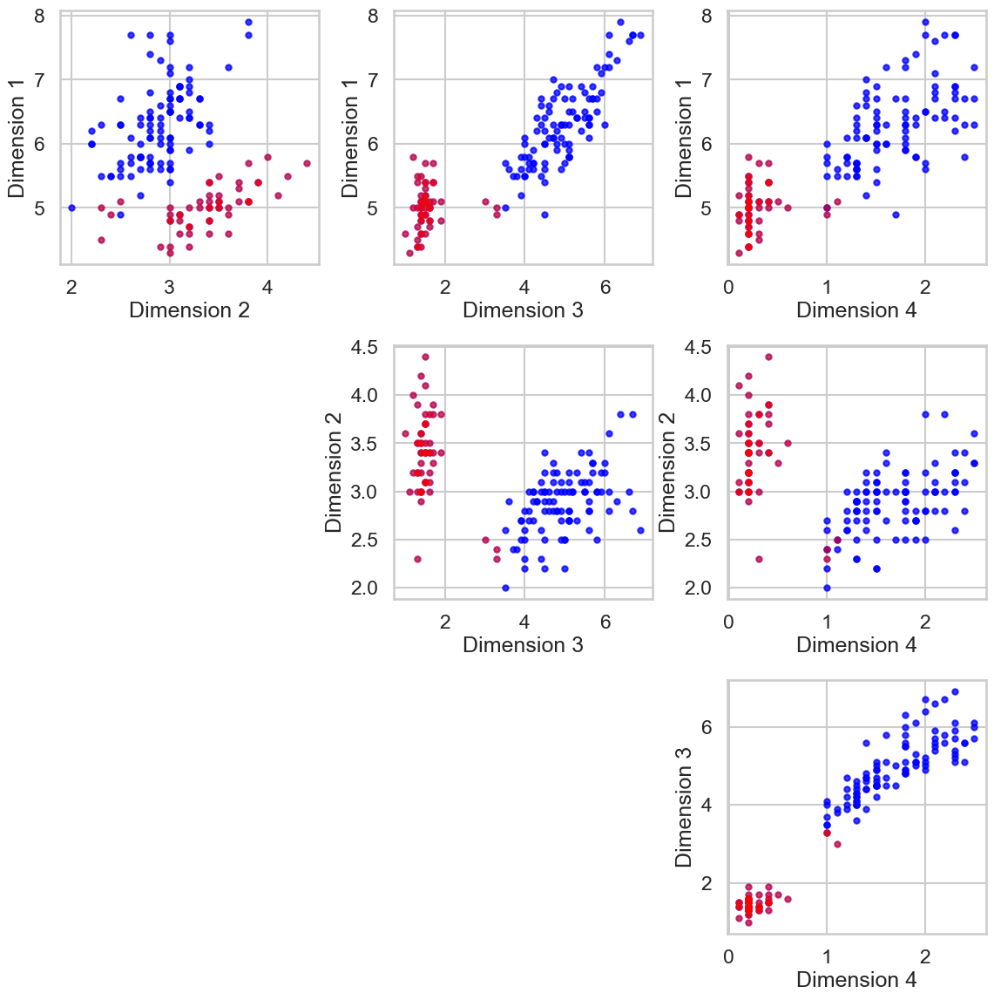

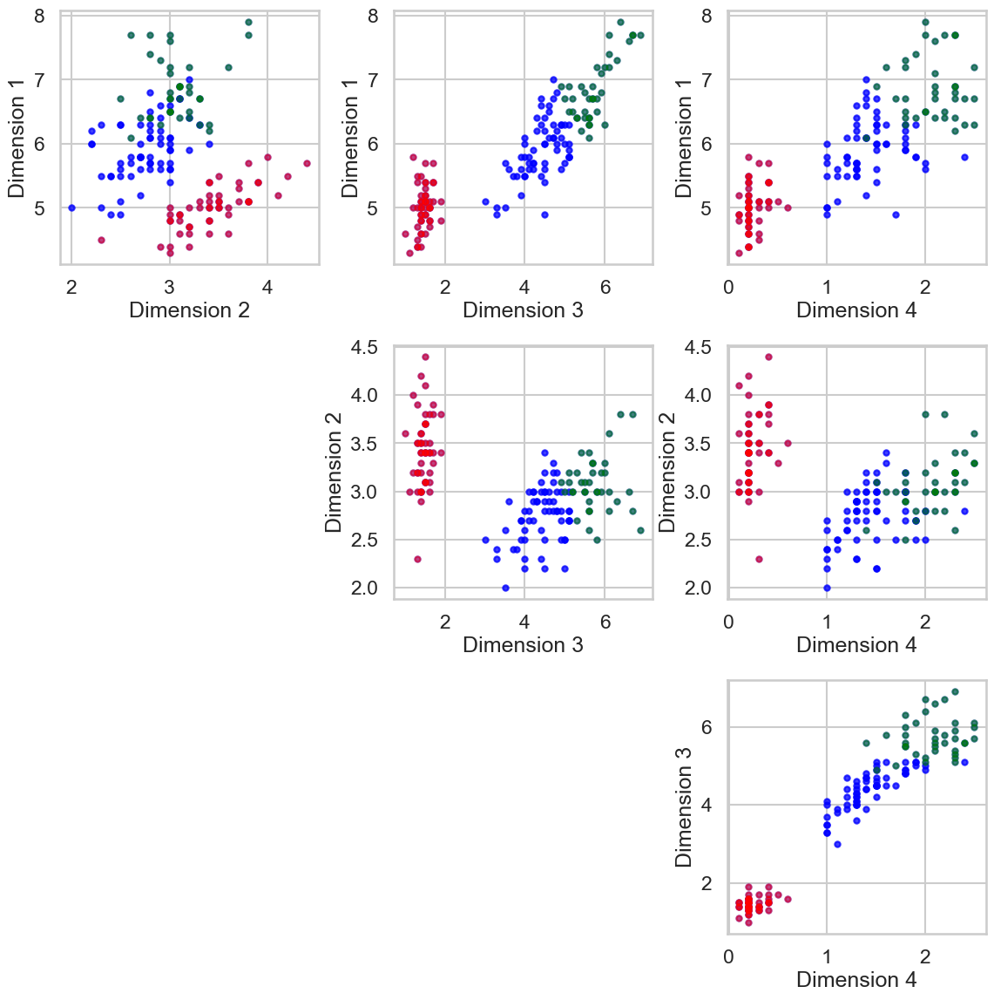

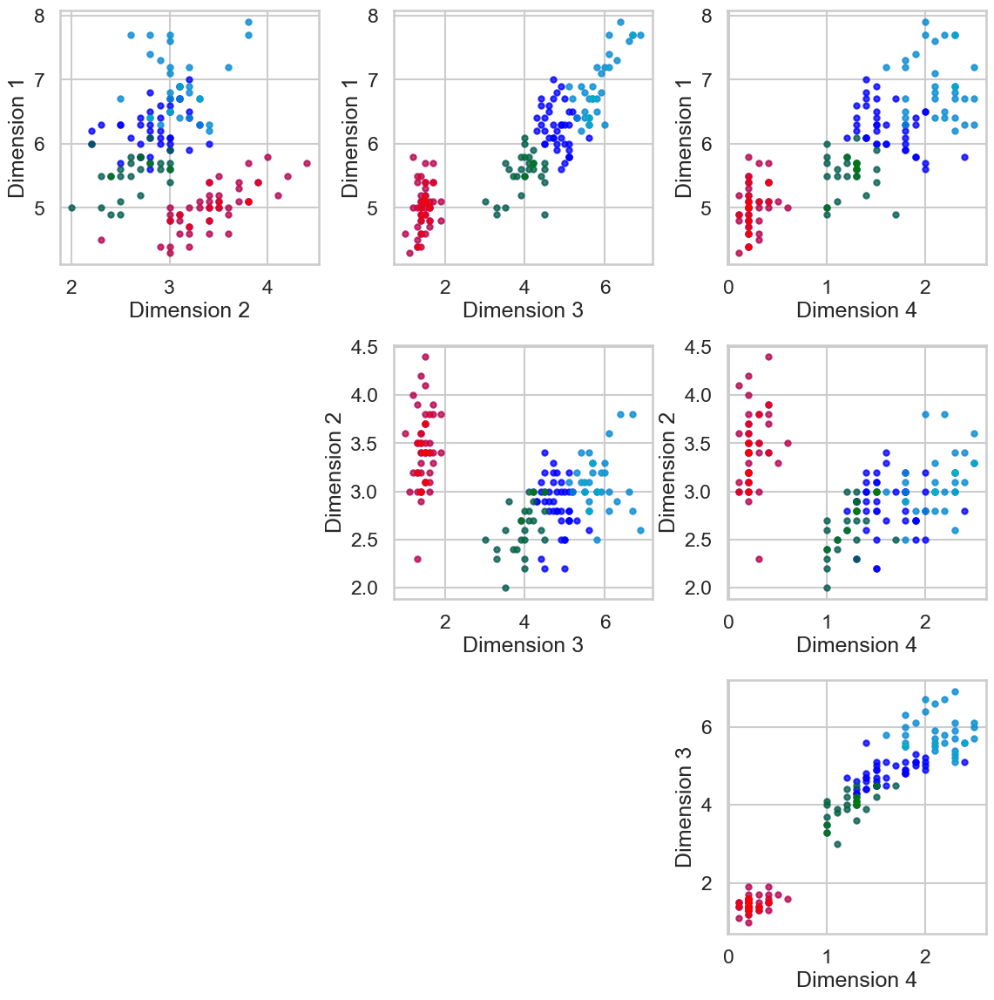

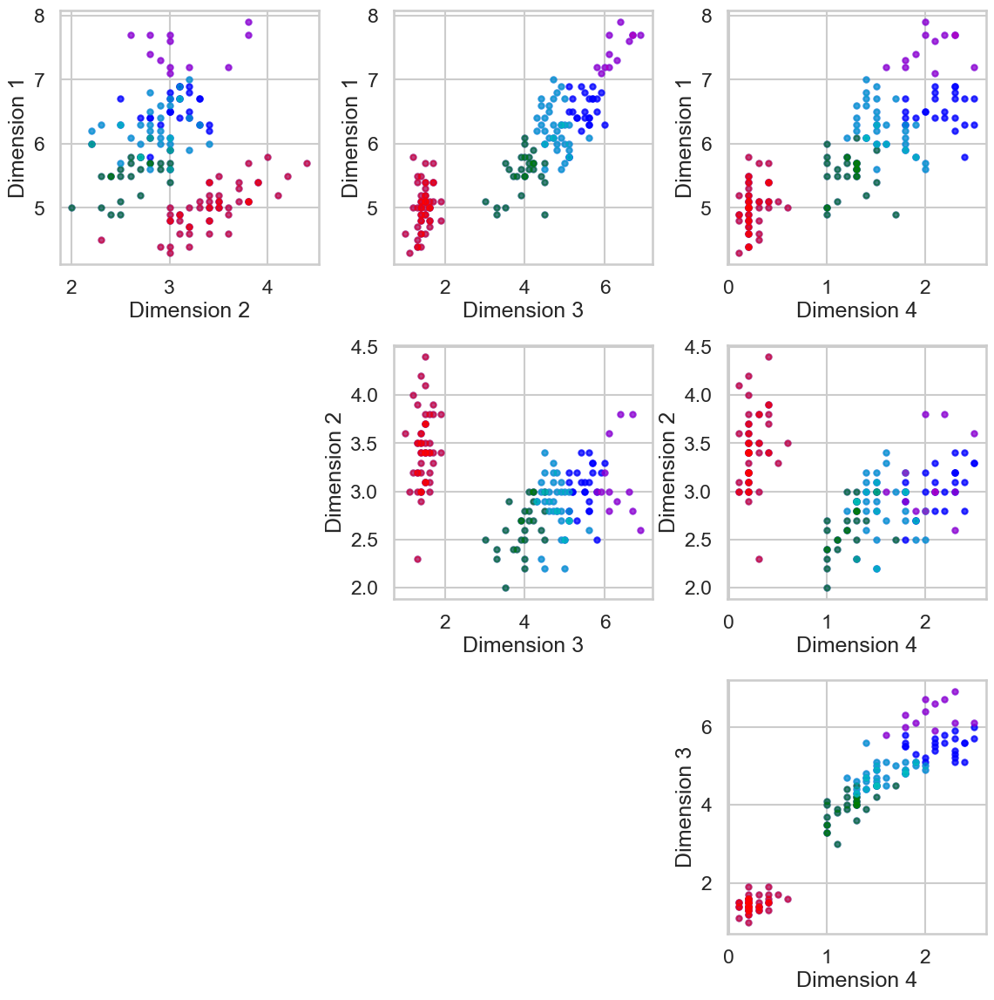

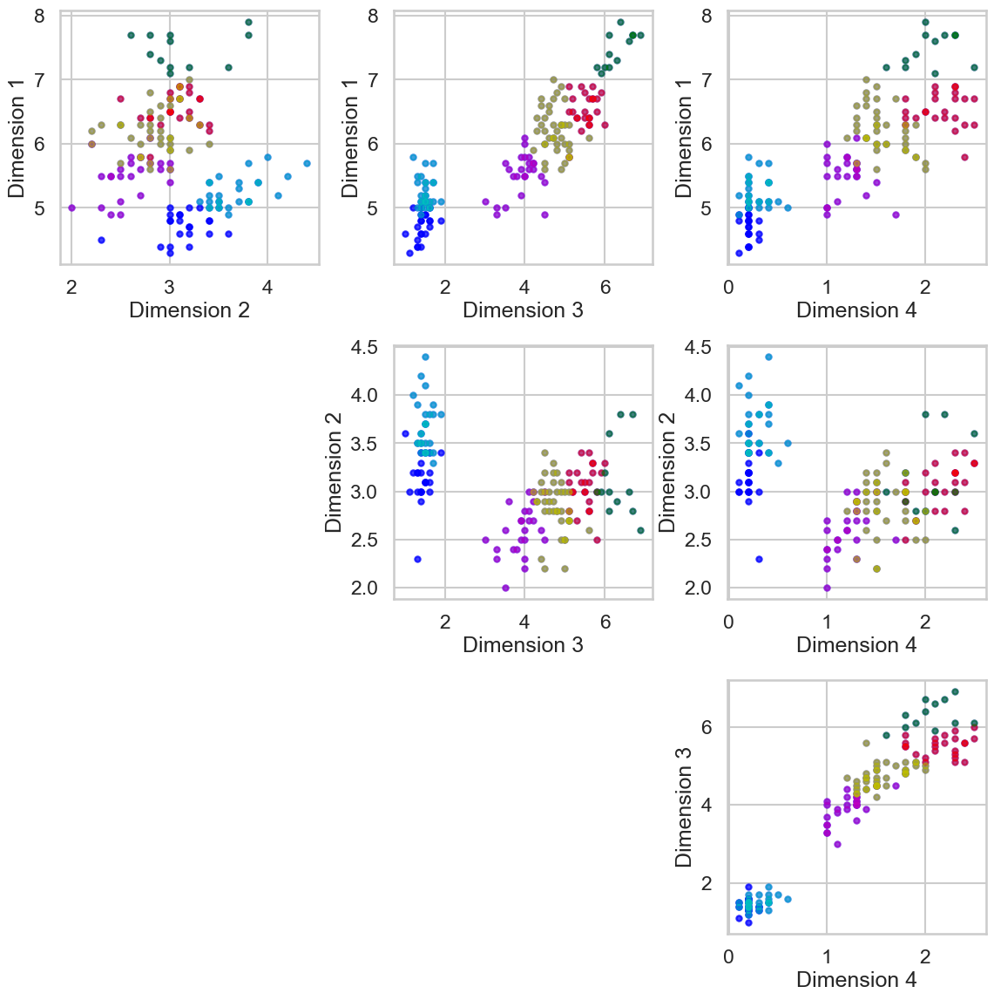

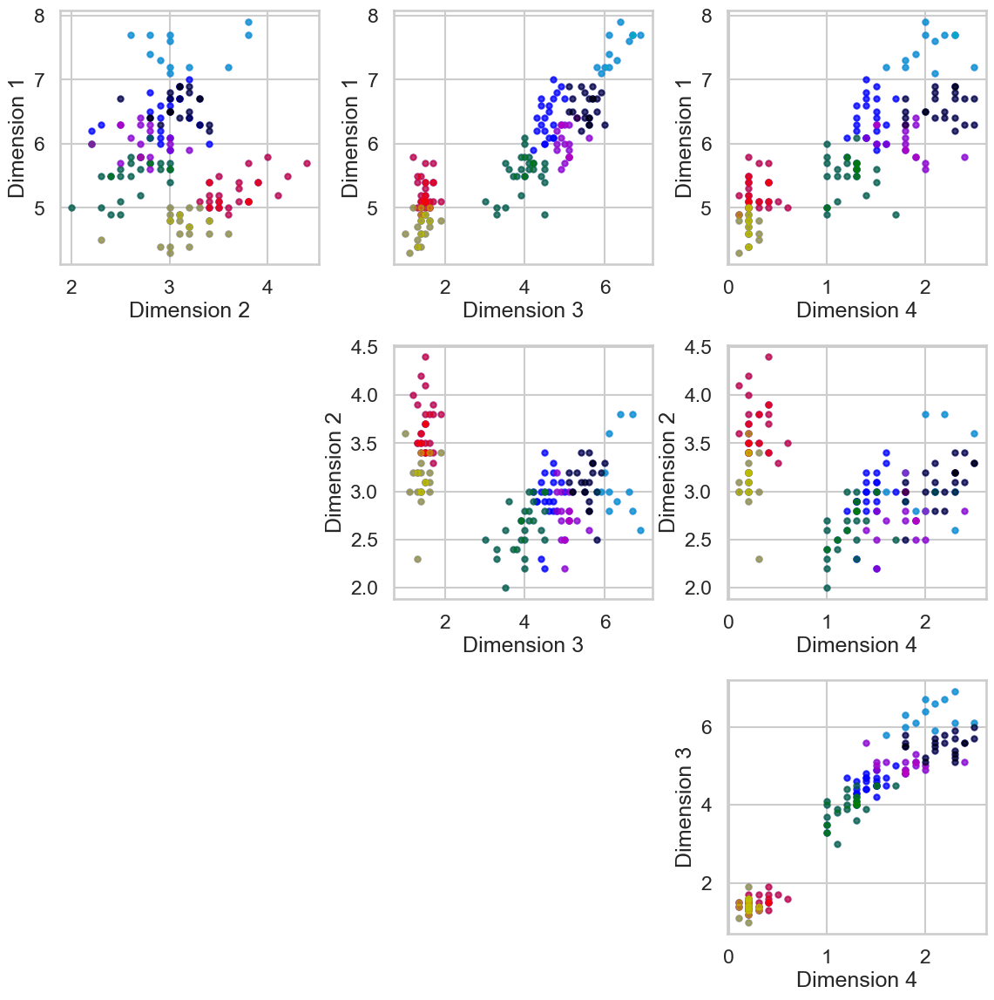

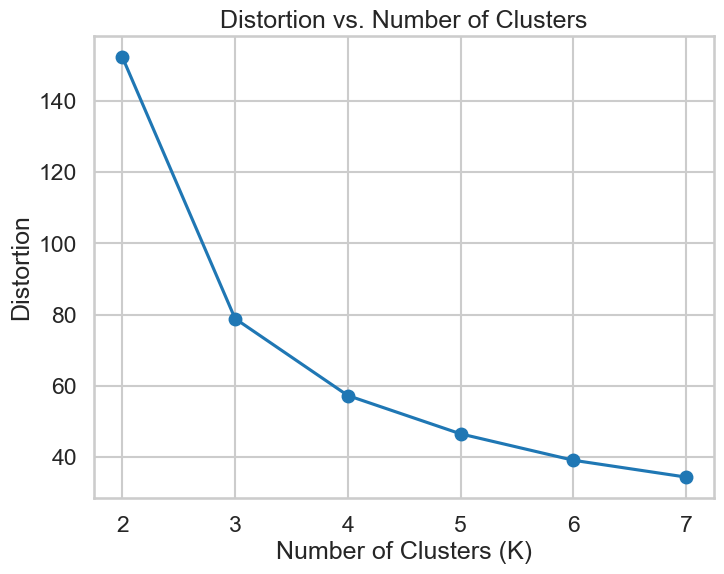

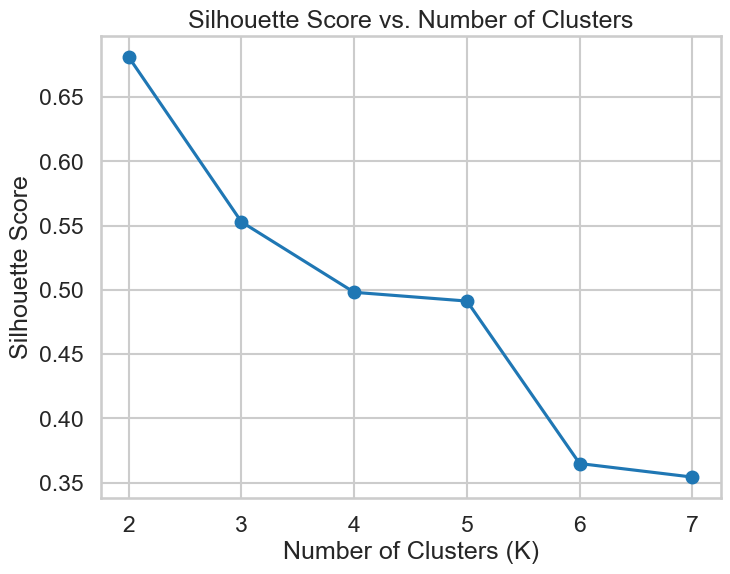

Best K: 2
Silhouette Score for Best K: 0.6810461692117462


In [9]:
#KMeans clustering
k_values = range(2, 8)
distortions = []
silhouette_scores = []
print(k_values)
for k in range(2, 8):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    display_cluster(X,cluster_labels,num_clusters=k)
    distortions.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
plt.figure(figsize=(8, 6))
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.xticks(k_values)
plt.grid(True)
plt.show()
#By using elbow point 4 clusters is approriate value of k
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print("Best K:", best_k)
best_silhouette_score = max(silhouette_scores)
print("Silhouette Score for Best K:", best_silhouette_score)


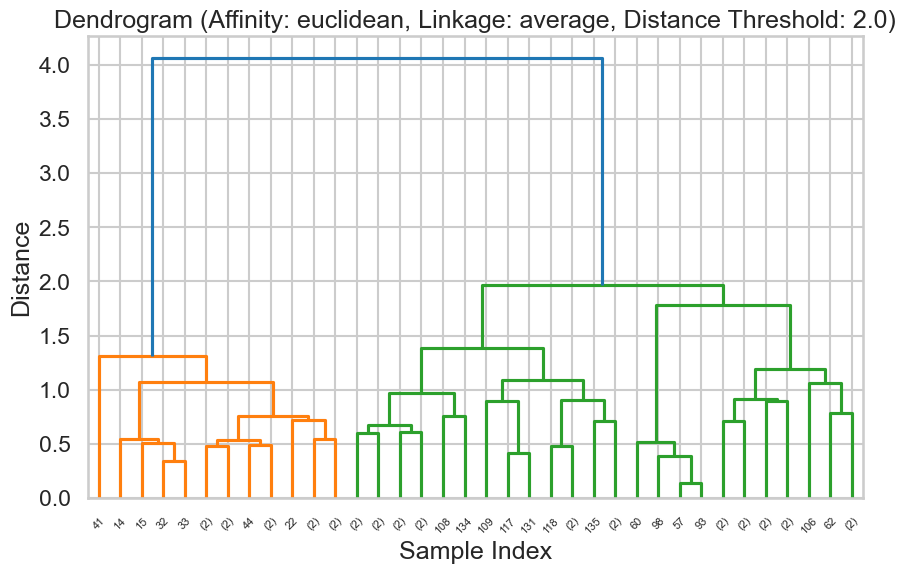

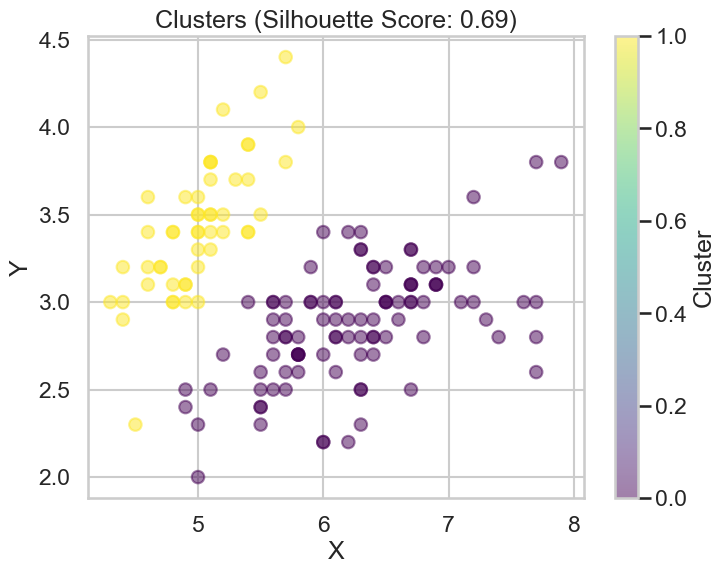

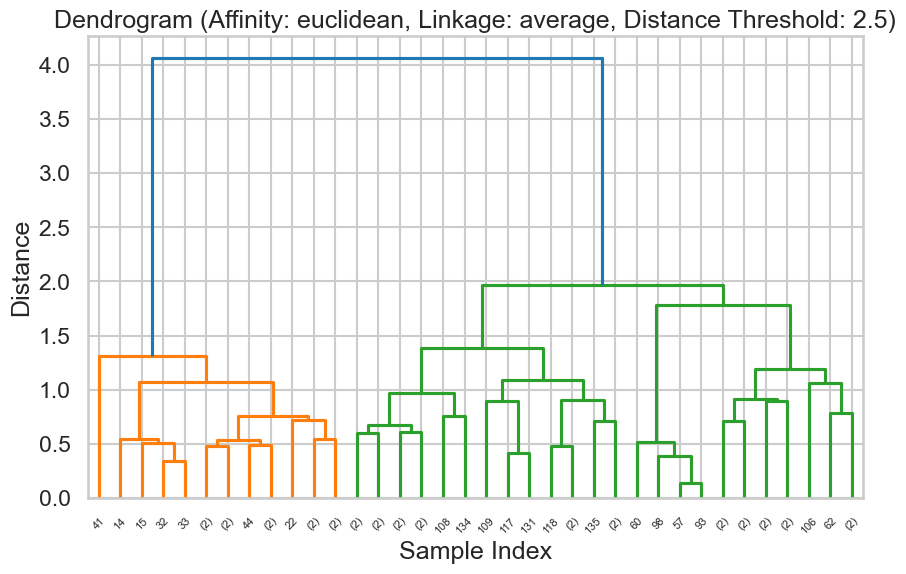

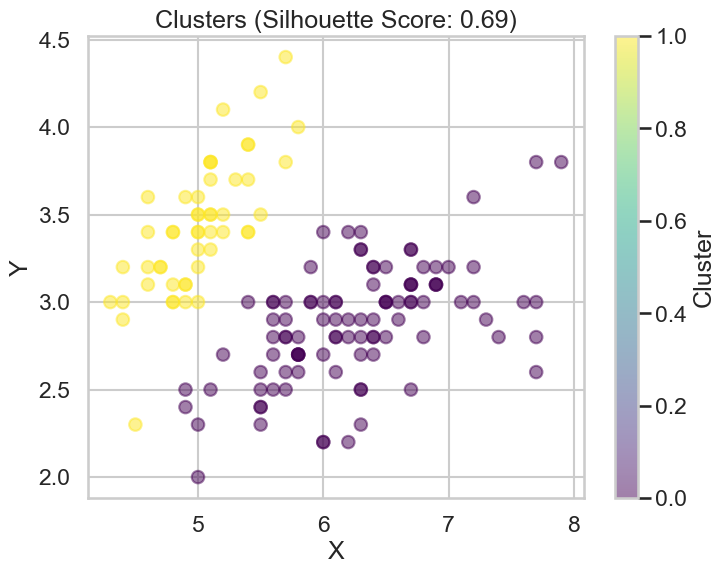

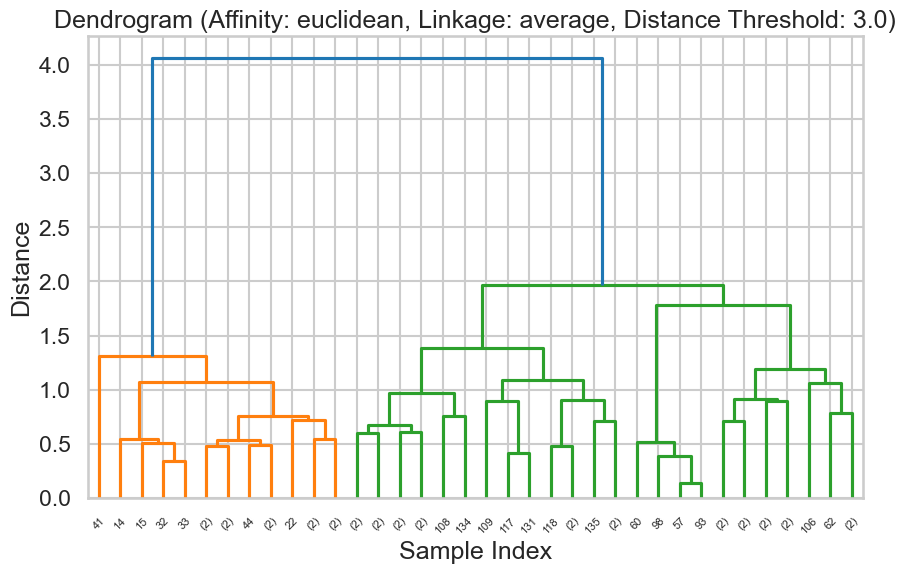

...

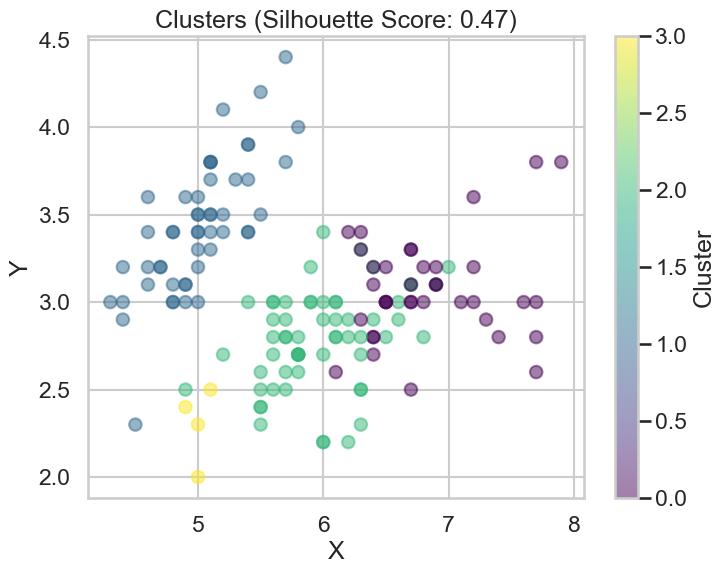

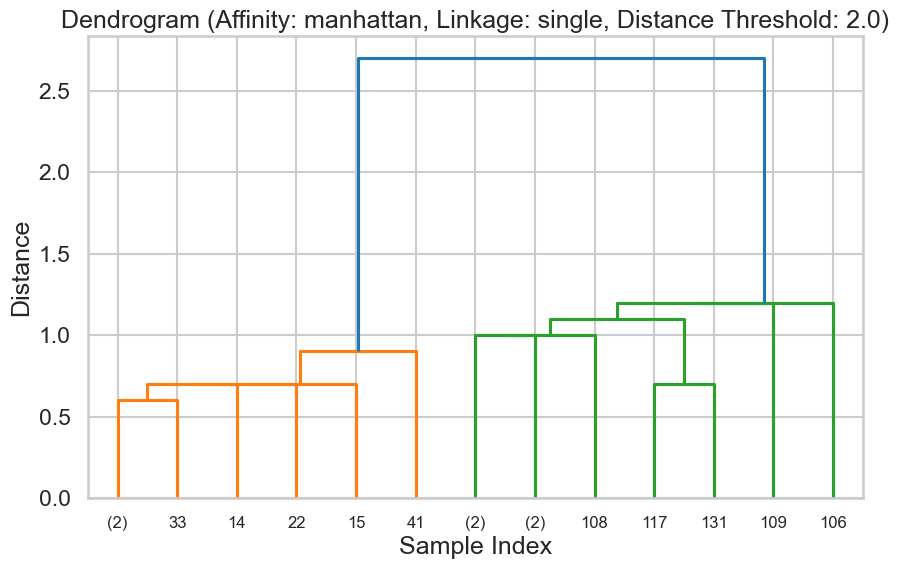

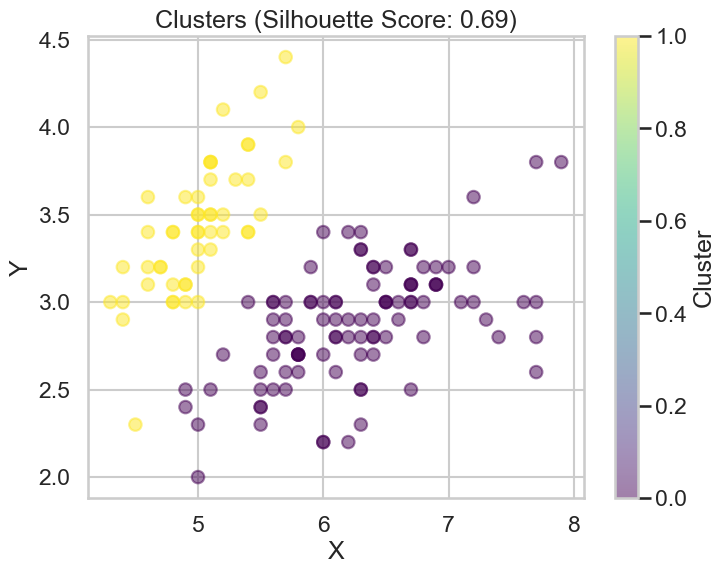

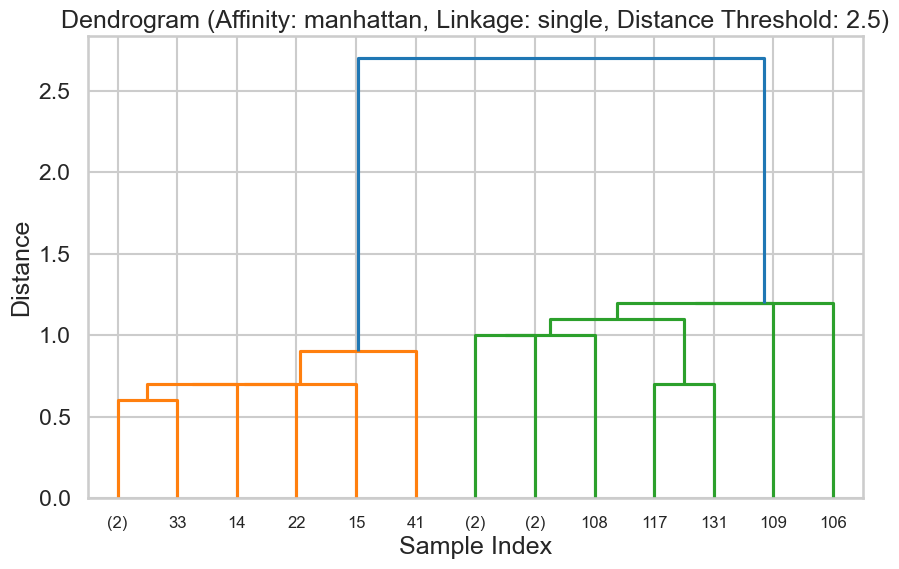

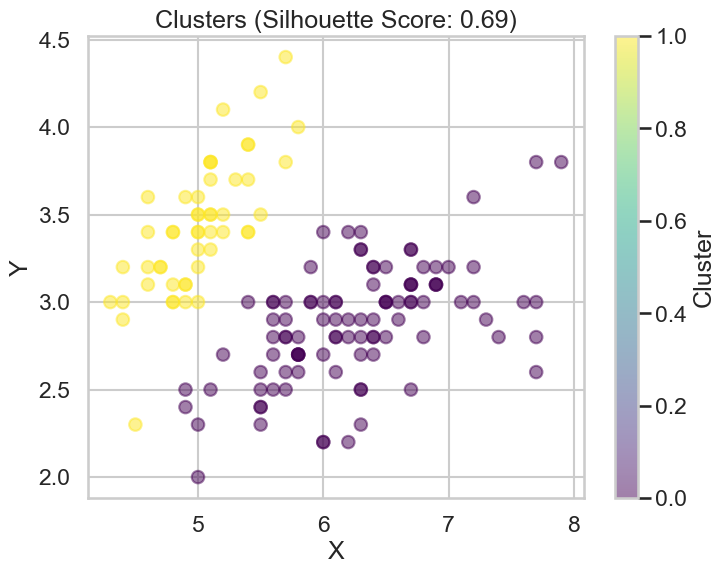

Best Silhouette Score: 0.6867350732769777
Best Parameters: ('euclidean', 'average', 2.0)


In [10]:
# Hierarchal Clustering
# Try different parameter combinations
parameter_combinations = [
    ('euclidean', 'average', 2.0),
    ('euclidean', 'average', 2.5),
    ('euclidean', 'average', 3.0),
    ('euclidean', 'single', 2.0),
    ('euclidean', 'single', 2.5),
    ('euclidean', 'single', 3.0),
    ('manhattan', 'average', 2.0),
    ('manhattan', 'average', 2.5),
    ('manhattan', 'average', 3.0),
    ('manhattan', 'single', 2.0),
    ('manhattan', 'single', 2.5),
    ('manhattan', 'single', 3.0),
    ('cosine', 'average', 2.0),
    ('cosine', 'average', 2.5),
    ('cosine', 'average', 3.0),
    ('cosine', 'single', 2.0),
    ('cosine', 'single', 2.5),
    ('cosine', 'single', 3.0)
]

best_silhouette_score = -1
best_parameters = None

for affinity, linkage, distance_threshold in parameter_combinations:
    silhouette_avg_current = evaluate_agglomerative_clustering(X, affinity, linkage, distance_threshold)

    if silhouette_avg_current < 0:
        continue
    
    if silhouette_avg_current > best_silhouette_score:
        best_silhouette_score = silhouette_avg_current
        best_parameters = (affinity, linkage, distance_threshold)

print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)
#Here the plotting of clusters is between feature one and two only in all numbers of cluters because i didnt use diplay_clutser

Best Silhouette Score: 0.6867350732769777
Best Parameters: (1.0157894736842106, 5)
Number of data points in iris dataset: 150
Number of cluster labels: 150


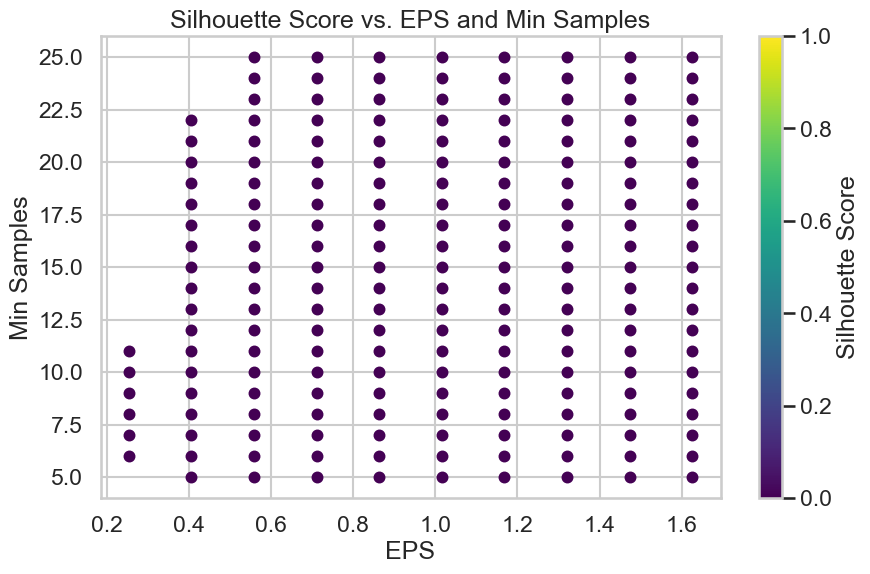

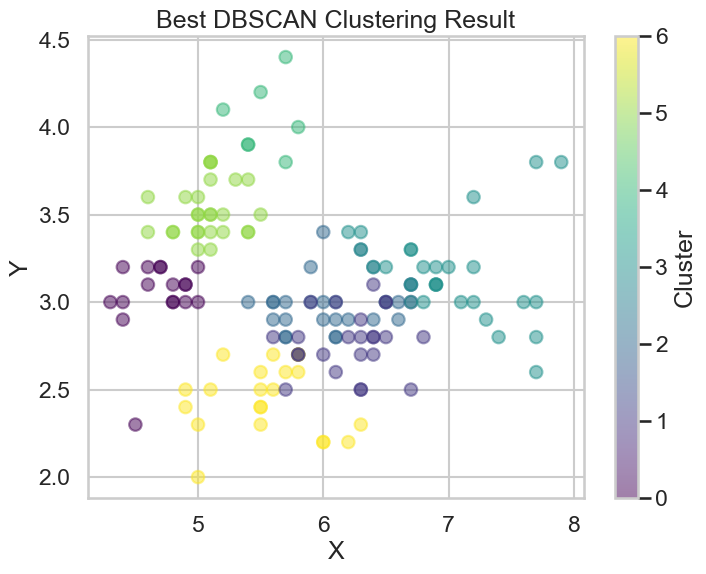

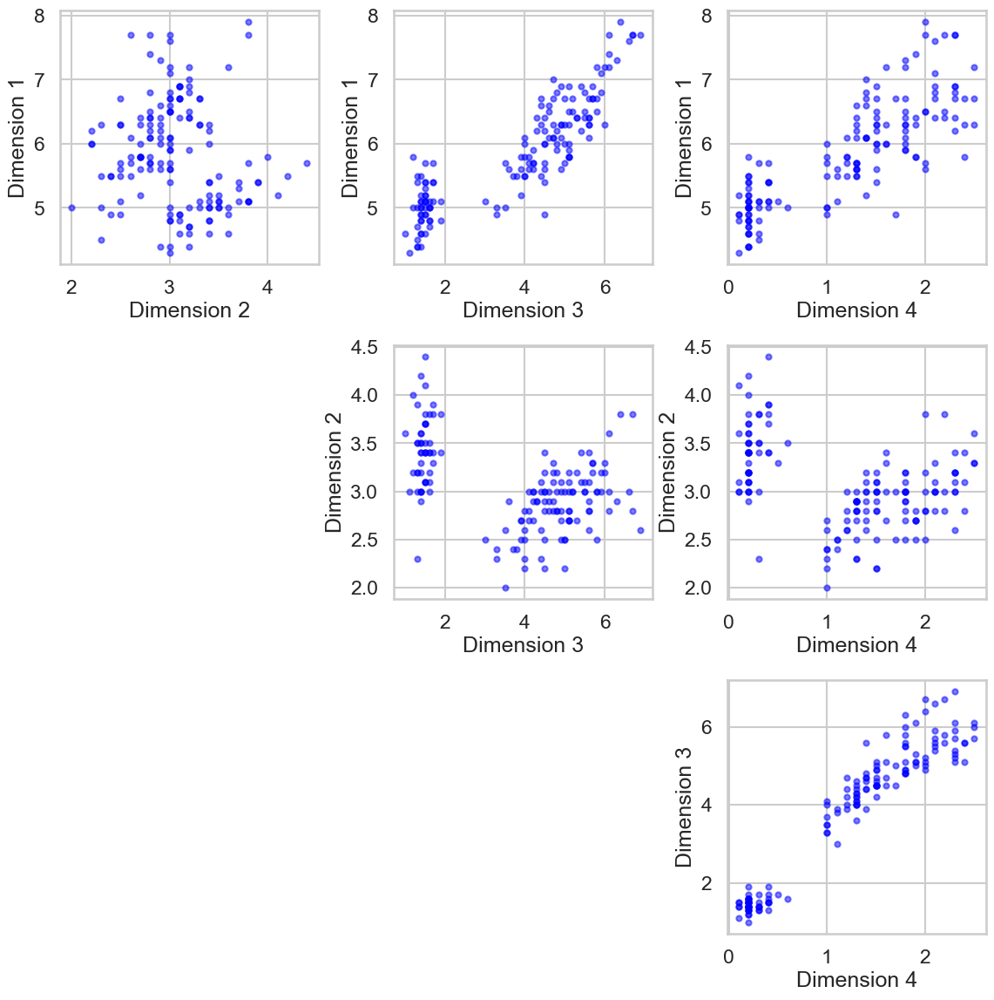

In [20]:
#DBScan clustering
ps_values = np.linspace(0.1, 3, 20)
min_samples_values = np.arange(5, 26)

best_silhouette_score = -1
best_parameters = None


silhouette_scores = []


for eps in eps_values:
    for min_samples in min_samples_values:
        silhouette_avg_current = evaluate_dbscan_clustering(X, eps, min_samples)
        
        
        if silhouette_avg_current < 0:
            continue
        
        
        silhouette_scores.append((eps, min_samples, silhouette_avg_current))
        
        
        if silhouette_avg_current > best_silhouette_score:
            best_silhouette_score = silhouette_avg_current
            best_parameters = (eps, min_samples)
            best_cluster_labels = cluster_labels
print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)


fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Silhouette Score vs. EPS and Min Samples')
ax.set_xlabel('EPS')
ax.set_ylabel('Min Samples')
# Check the dimensions of the iris data
print("Number of data points in iris dataset:", len(X))

# Check the dimensions of the cluster labels
print("Number of cluster labels:", len(best_cluster_labels))
for eps, min_samples, silhouette_avg in silhouette_scores:
    ax.scatter(eps, min_samples, c=silhouette_avg, cmap='viridis', s=50)
cbar = plt.colorbar(ax.scatter([], [], c=[], cmap='viridis'), ax=ax, label='Silhouette Score')
plt.show()
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=best_cluster_labels, cmap='viridis', alpha=0.5)
plt.title('Best DBSCAN Clustering Result')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(label='Cluster')
plt.show()


# If the number of cluster labels is not equal to the number of data points,
# you may need to adjust it to ensure alignment
# Make sure that best_cluster_labels contains the correct labels for each data point in the iris dataset

# Plot best clustering result
display_cluster(X, best_cluster_labels)




In [12]:
# Normalizing the data
from sklearn.preprocessing import StandardScaler
# Normalize the features
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

range(2, 8)


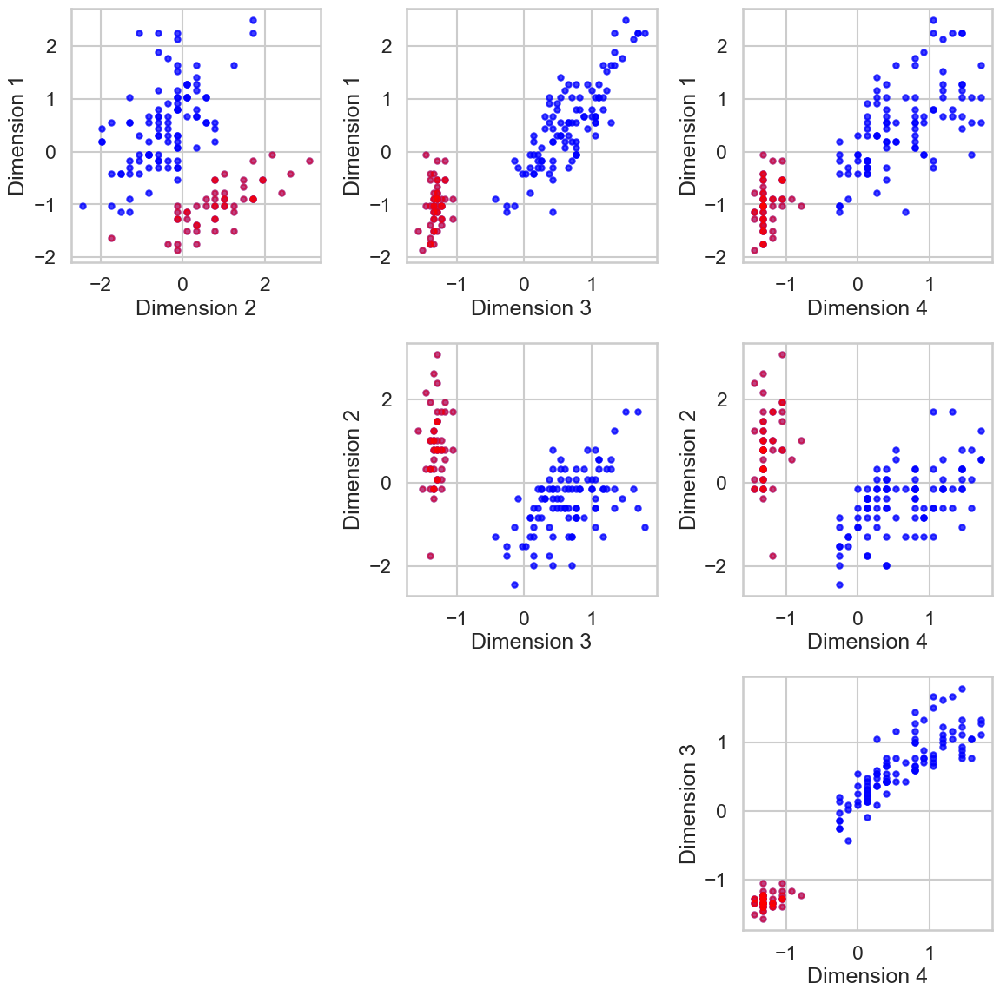

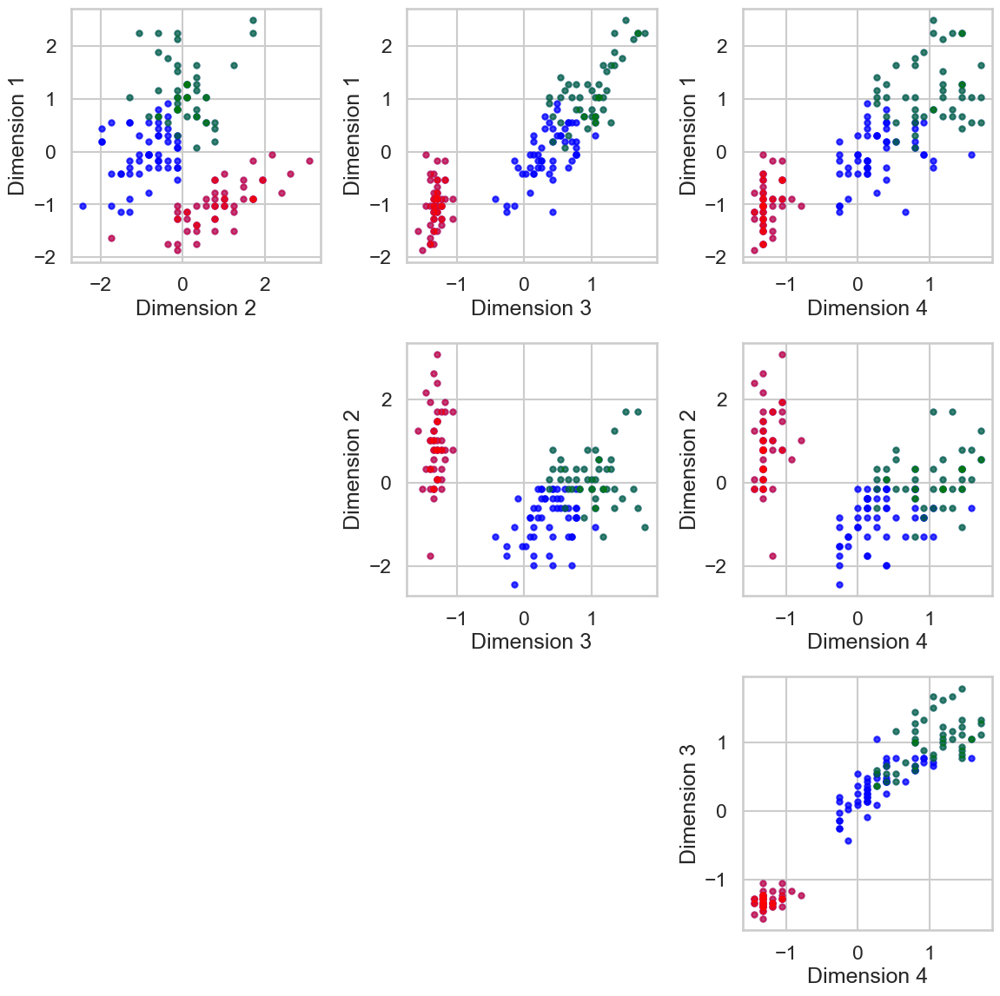

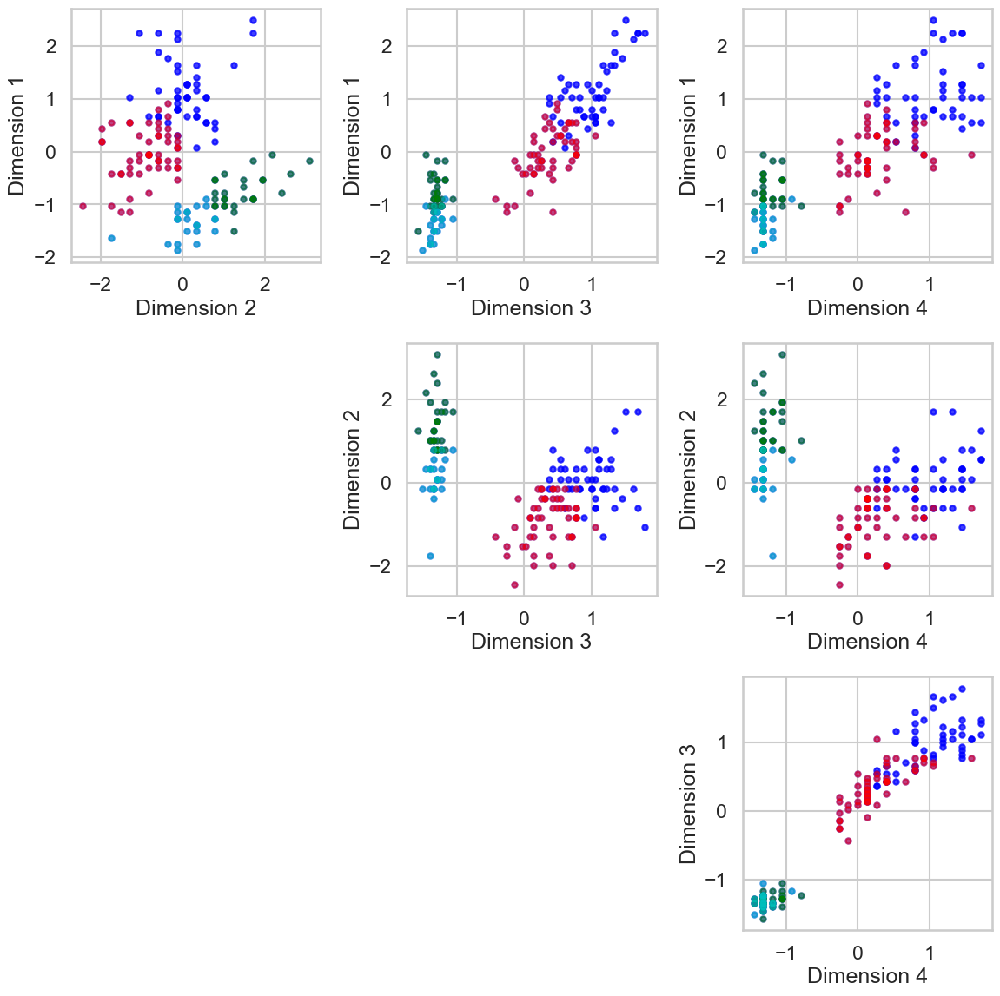

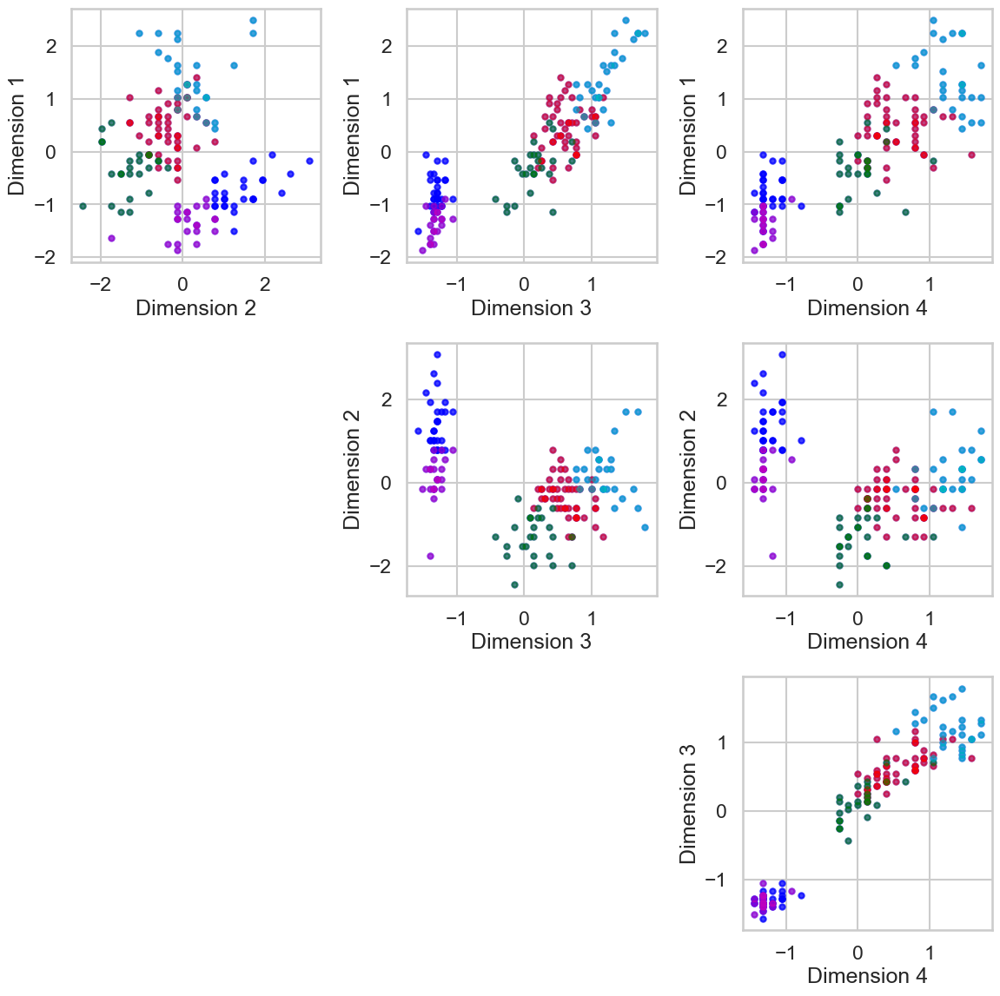

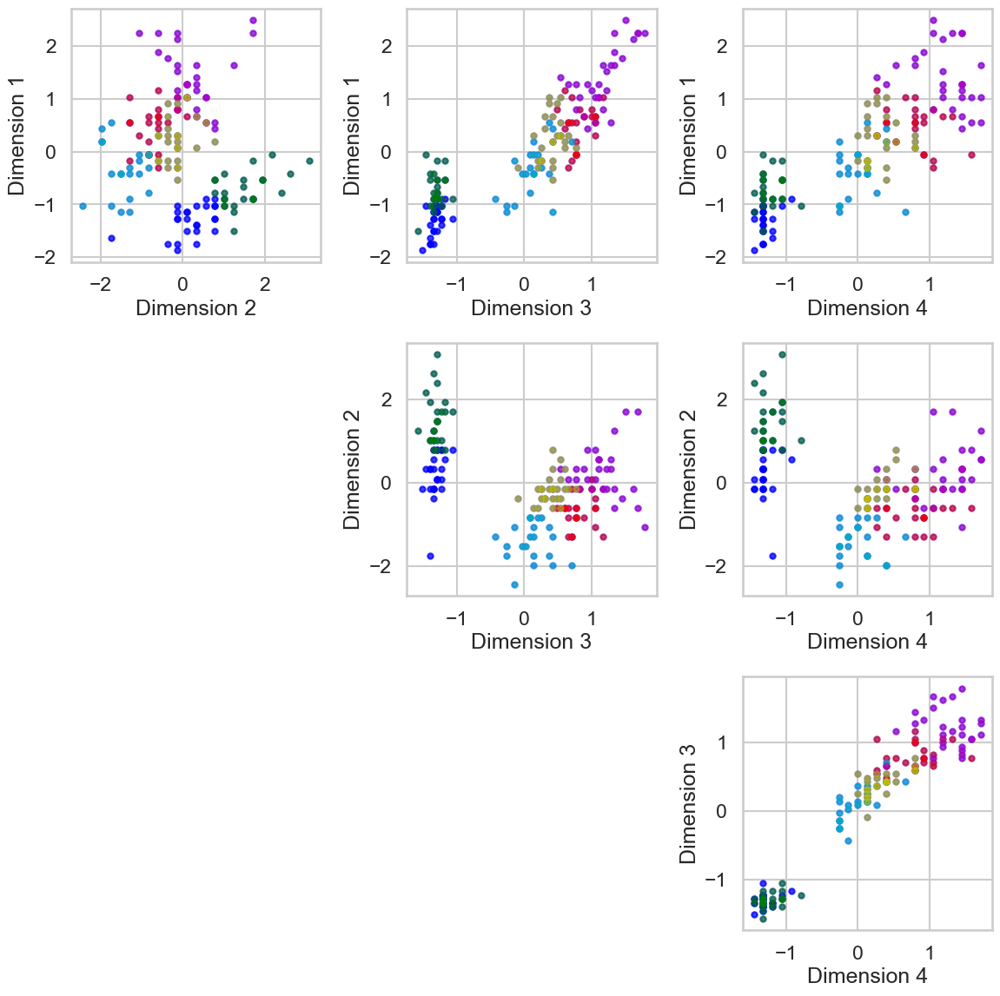

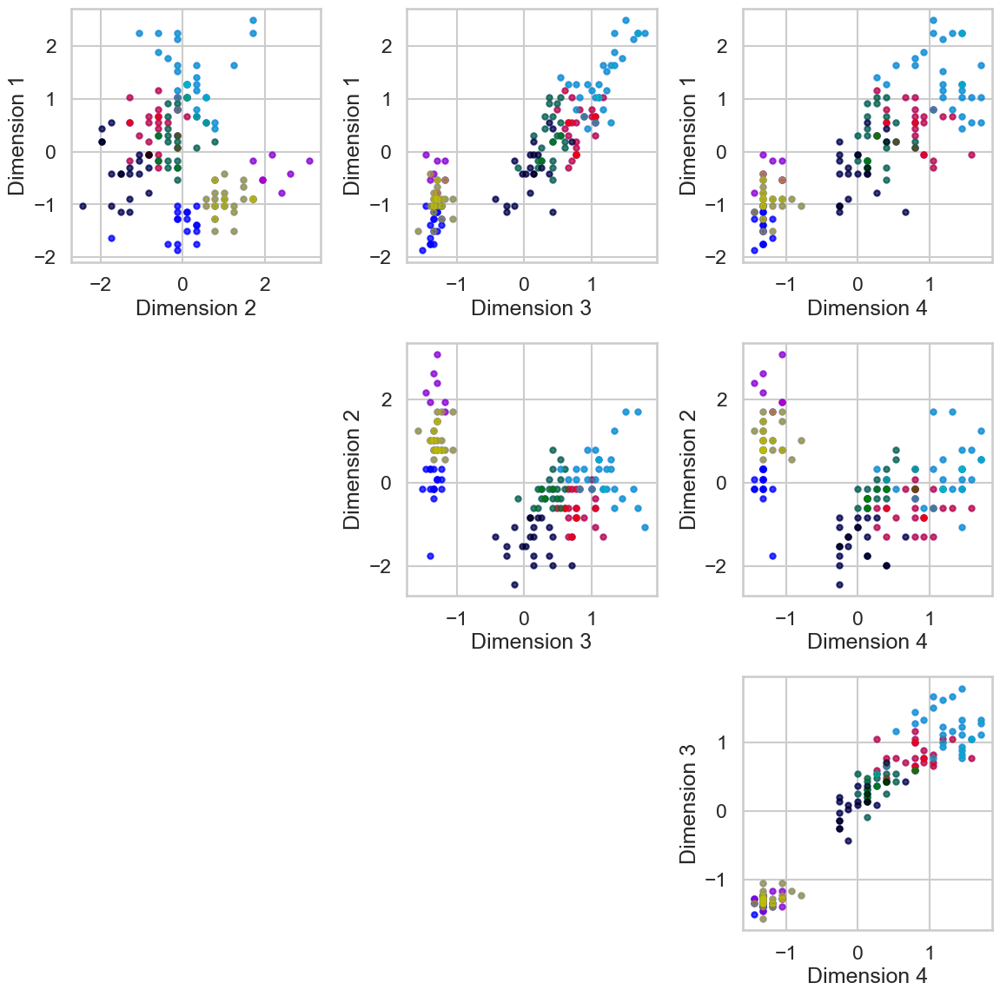

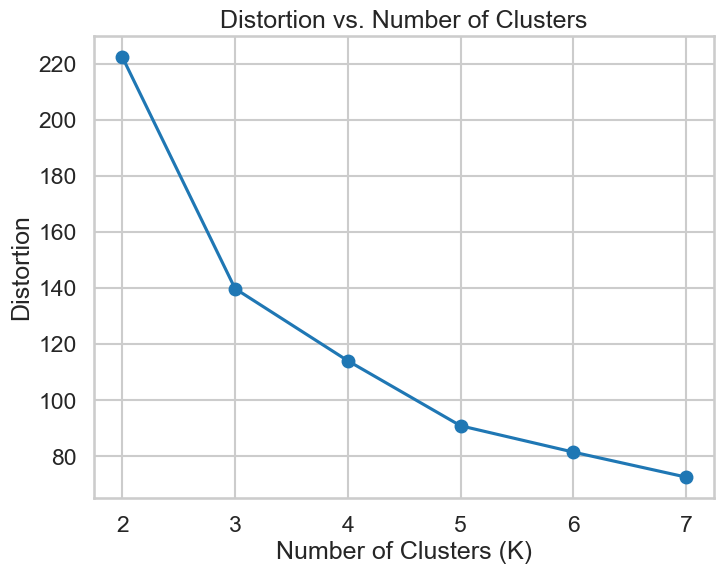

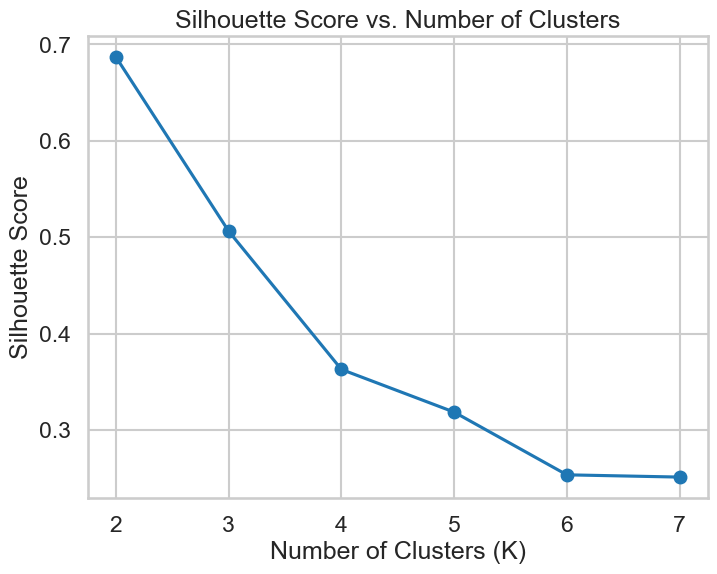

Best K: 2
Silhouette Score for Best K: 0.6867350732769777


In [13]:
#Normalized KMeans clustering
k_values = range(2, 8)
distortions = []
silhouette_scores = []
print(k_values)
for k in range(2, 8):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X_normalized,cluster_labels)
    display_cluster(X_normalized,cluster_labels,num_clusters=k)
    distortions.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
plt.figure(figsize=(8, 6))
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.xticks(k_values)
plt.grid(True)
plt.show()
#By using elbow point 4 clusters is approriate value of k
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print("Best K:", best_k)
best_silhouette_score = max(silhouette_scores)
print("Silhouette Score for Best K:", best_silhouette_score)


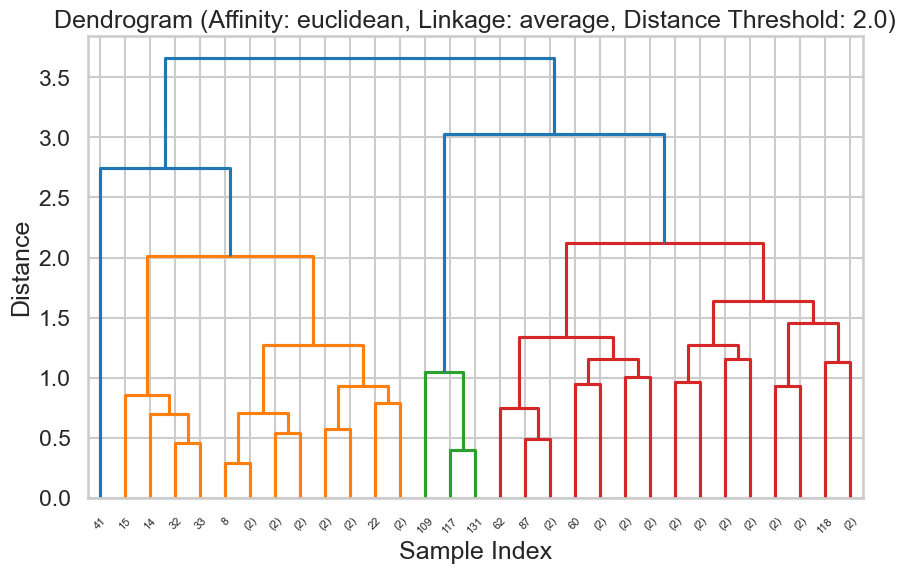

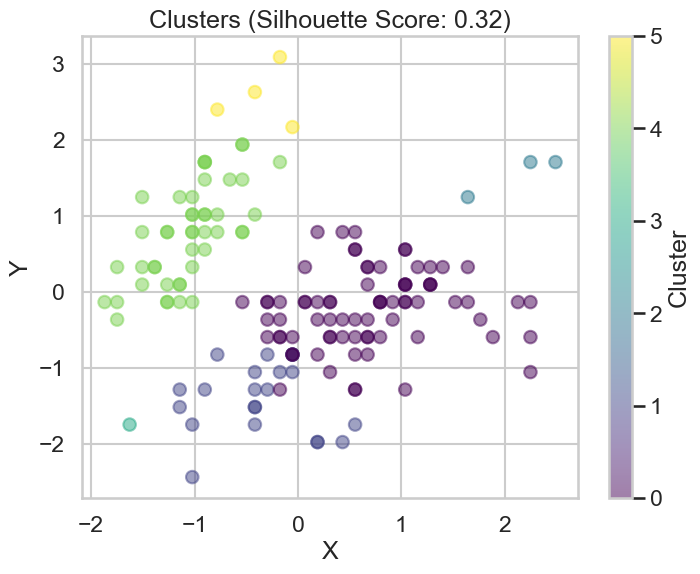

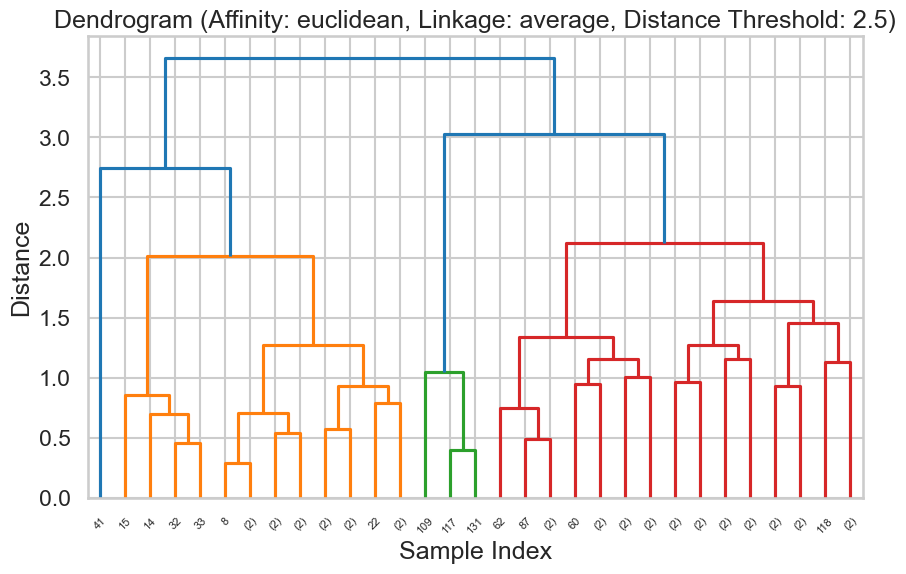

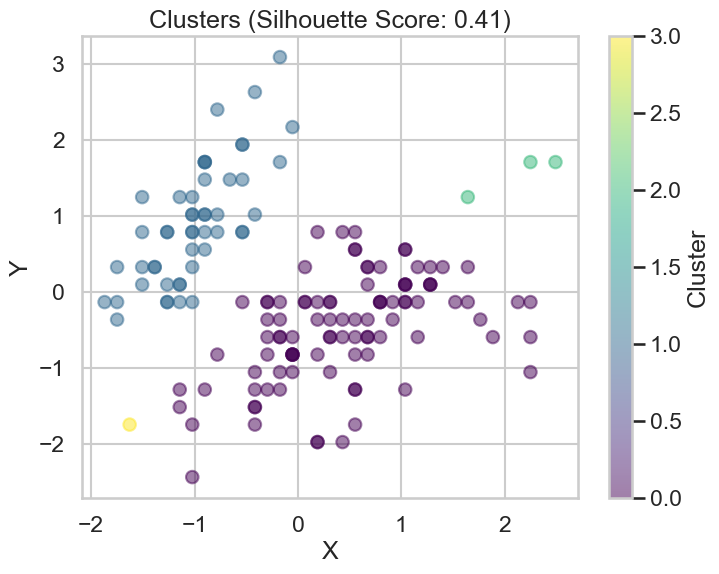

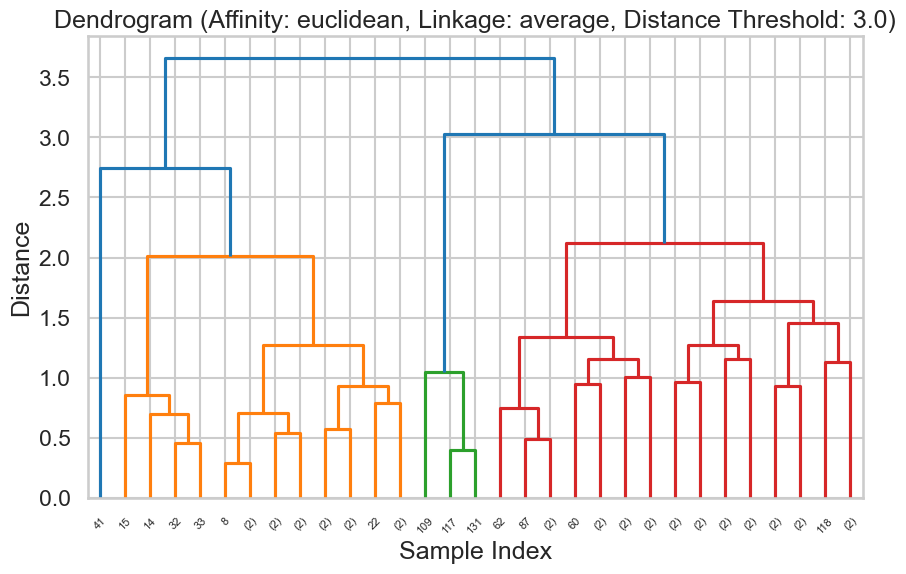

...

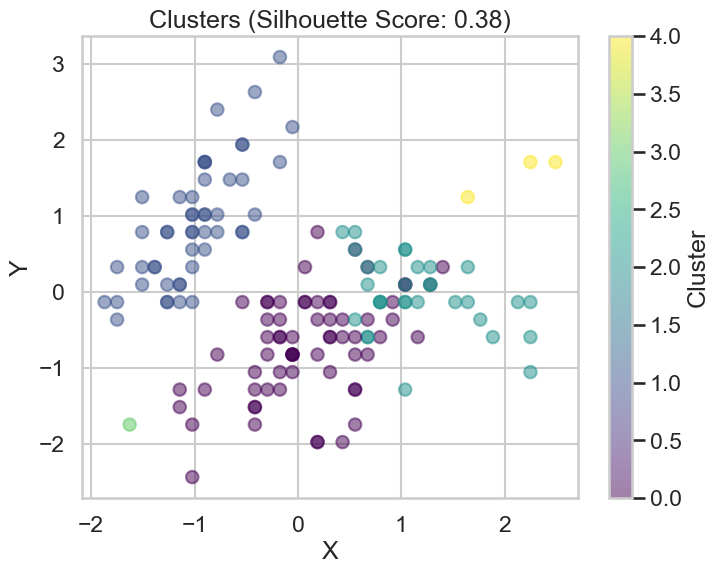

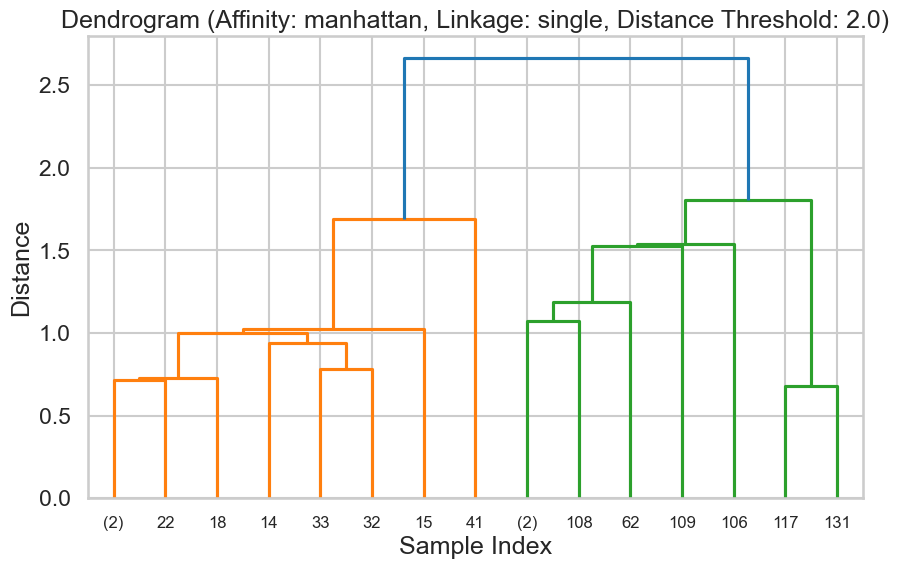

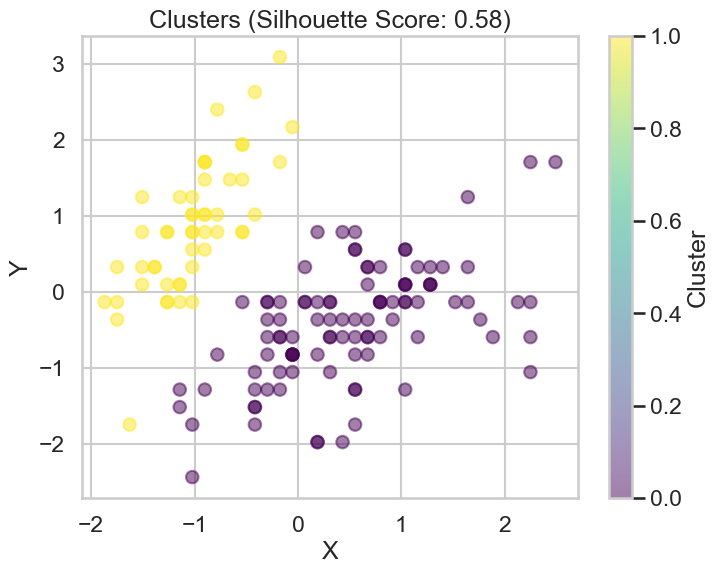

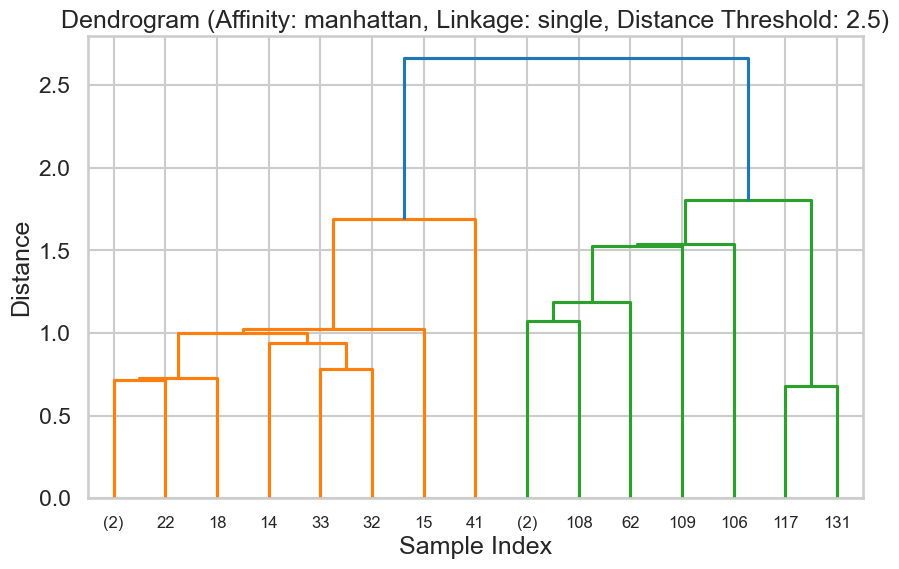

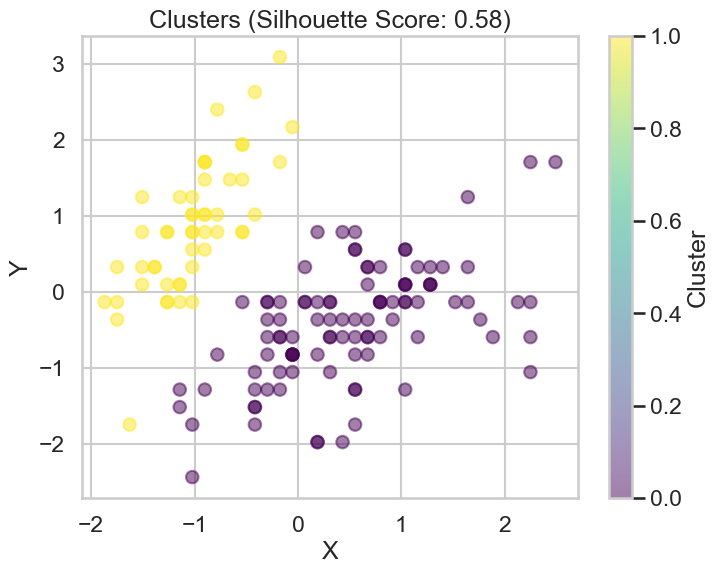

Best Silhouette Score: 0.5817500491982808
Best Parameters: ('manhattan', 'single', 2.0)


In [14]:
#Normalized Hierarchal Clustering
# Hierarchal Clustering
# Try different parameter combinations
parameter_combinations = [
    ('euclidean', 'average', 2.0),
    ('euclidean', 'average', 2.5),
    ('euclidean', 'average', 3.0),
    ('euclidean', 'single', 2.0),
    ('euclidean', 'single', 2.5),
    ('euclidean', 'single', 3.0),
    ('manhattan', 'average', 2.0),
    ('manhattan', 'average', 2.5),
    ('manhattan', 'average', 3.0),
    ('manhattan', 'single', 2.0),
    ('manhattan', 'single', 2.5),
    ('manhattan', 'single', 3.0),
    ('cosine', 'average', 2.0),
    ('cosine', 'average', 2.5),
    ('cosine', 'average', 3.0),
    ('cosine', 'single', 2.0),
    ('cosine', 'single', 2.5),
    ('cosine', 'single', 3.0)
]

best_silhouette_score = -1
best_parameters = None

for affinity, linkage, distance_threshold in parameter_combinations:
    silhouette_avg_current = evaluate_agglomerative_clustering(X_normalized, affinity, linkage, distance_threshold)

    if silhouette_avg_current < 0:
        continue
    
    if silhouette_avg_current > best_silhouette_score:
        best_silhouette_score = silhouette_avg_current
        best_parameters = (affinity, linkage, distance_threshold)

print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)
#Here the plotting of clusters is between feature one and two only in all numbers of cluters because i didnt use diplay_clutser

Best Silhouette Score: 0.5817500491982808
Best Parameters: (1.473684210526316, 5)


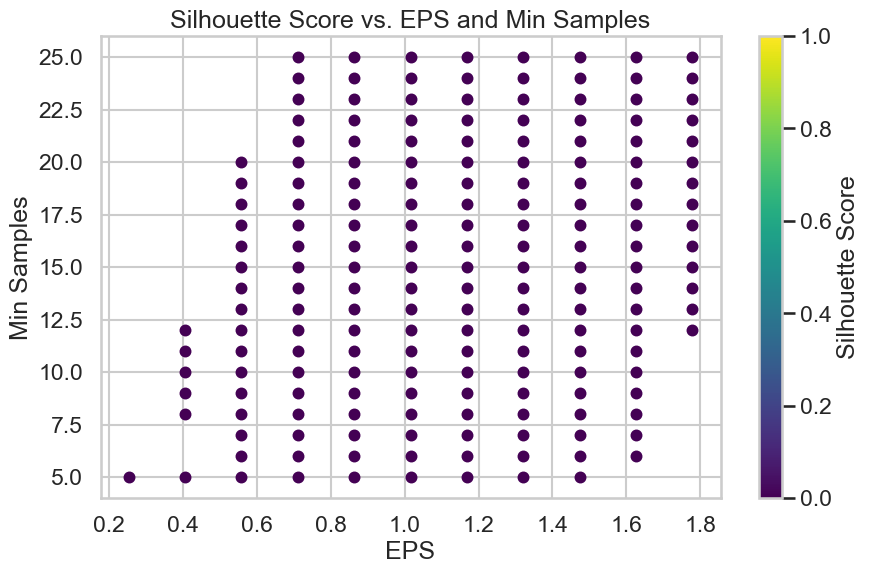

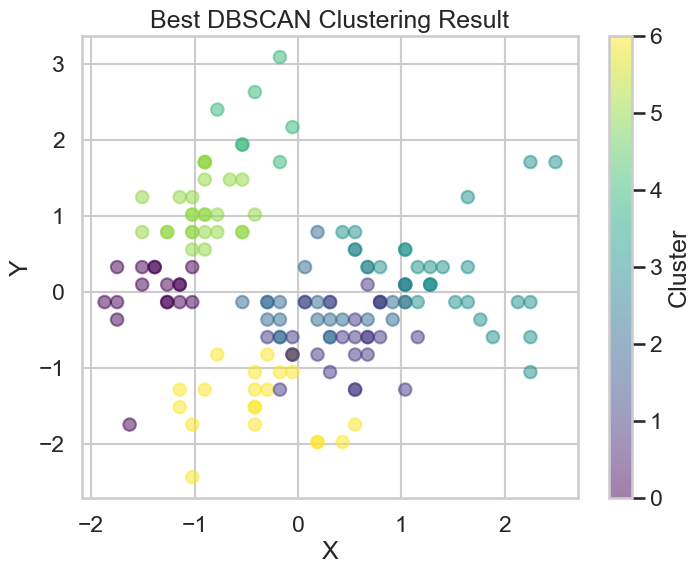

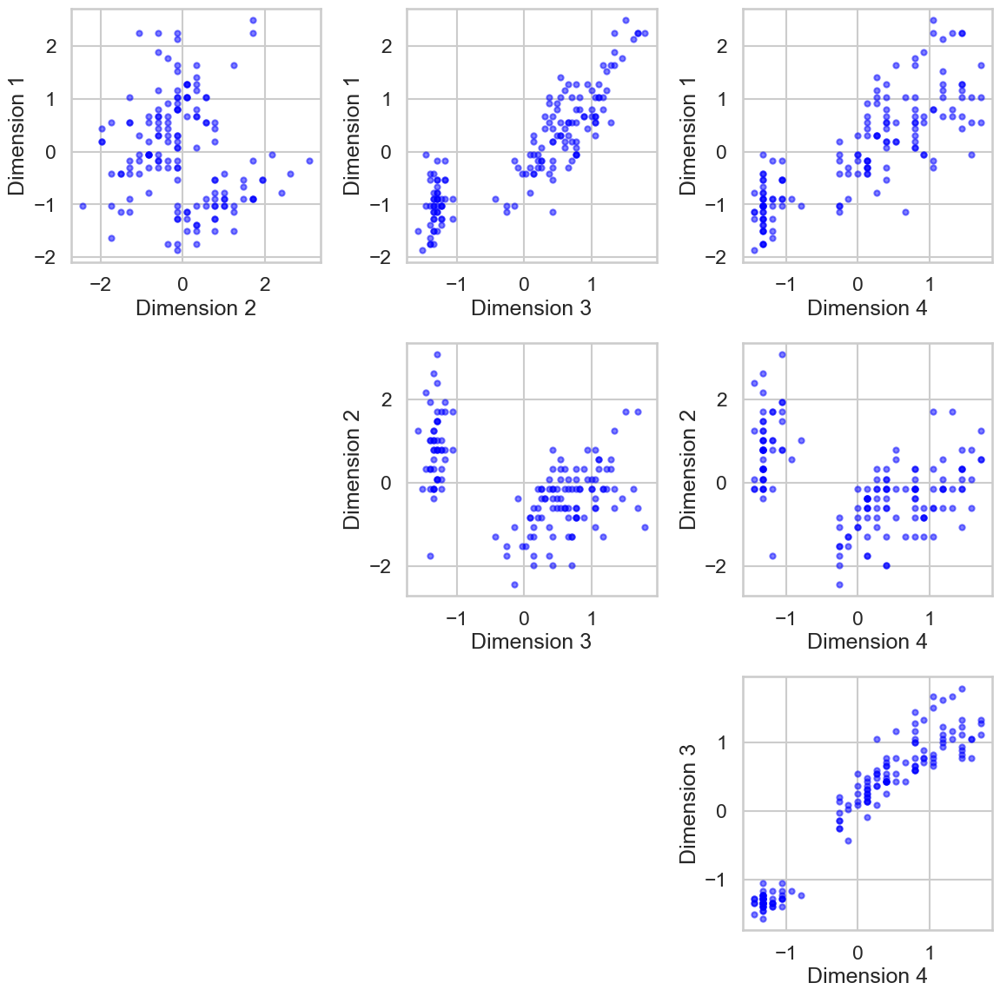

In [21]:
#Normalized DBScan clustering
ps_values = np.linspace(0.1, 3, 20)
min_samples_values = np.arange(5, 26)

best_silhouette_score = -1
best_parameters = None


silhouette_scores = []


for eps in eps_values:
    for min_samples in min_samples_values:
        silhouette_avg_current = evaluate_dbscan_clustering(X_normalized, eps, min_samples)
        
        
        if silhouette_avg_current < 0:
            continue
        
        
        silhouette_scores.append((eps, min_samples, silhouette_avg_current))
        
        
        if silhouette_avg_current > best_silhouette_score:
            best_silhouette_score = silhouette_avg_current
            best_parameters = (eps, min_samples)
            best_cluster_labels = cluster_labels
print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)


fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Silhouette Score vs. EPS and Min Samples')
ax.set_xlabel('EPS')
ax.set_ylabel('Min Samples')
for eps, min_samples, silhouette_avg in silhouette_scores:
    ax.scatter(eps, min_samples, c=silhouette_avg, cmap='viridis', s=50)
cbar = plt.colorbar(ax.scatter([], [], c=[], cmap='viridis'), ax=ax, label='Silhouette Score')
plt.show()
plt.figure(figsize=(8, 6))
plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=best_cluster_labels, cmap='viridis', alpha=0.5)
plt.title('Best DBSCAN Clustering Result')
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(label='Cluster')
plt.show()
# Plot best clustering result
display_cluster(X_normalized, best_cluster_labels)


* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

In [33]:
#Loading Data Set
# Load customer data from CSV file
customer_data = pd.read_csv('C:\\Users\\DR\\Downloads\\Assignment1_ML\\Customer_data.csv')

# Convert DataFrame to NumPy array
customer_data_array = customer_data.values
print(customer_data_array.shape)

(2000, 8)


range(2, 8)


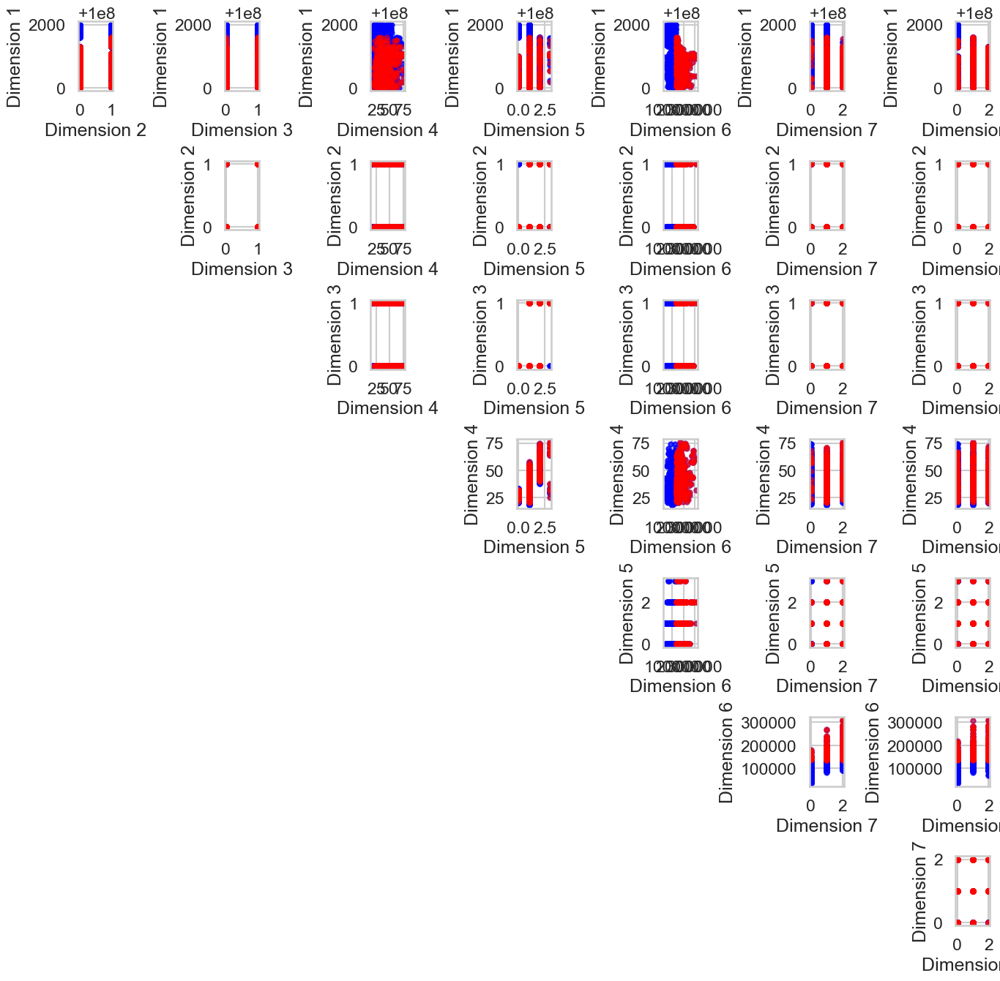

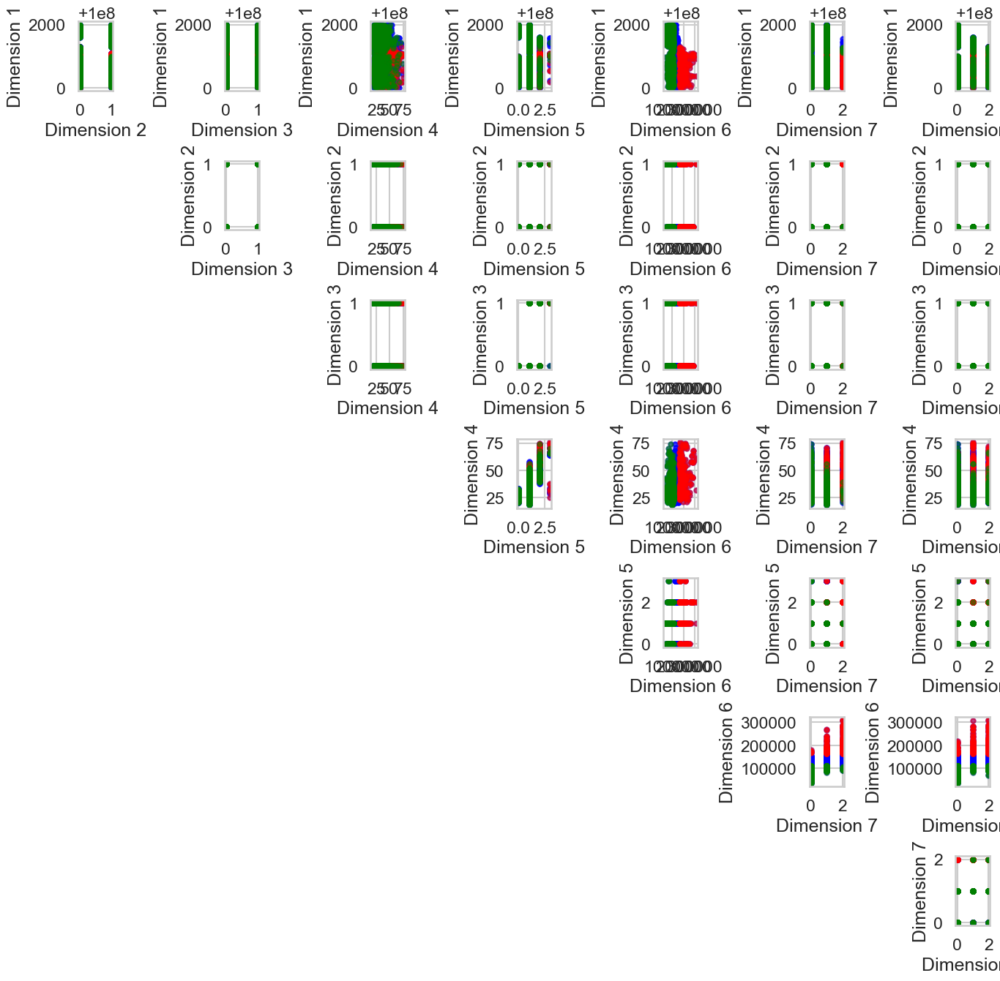

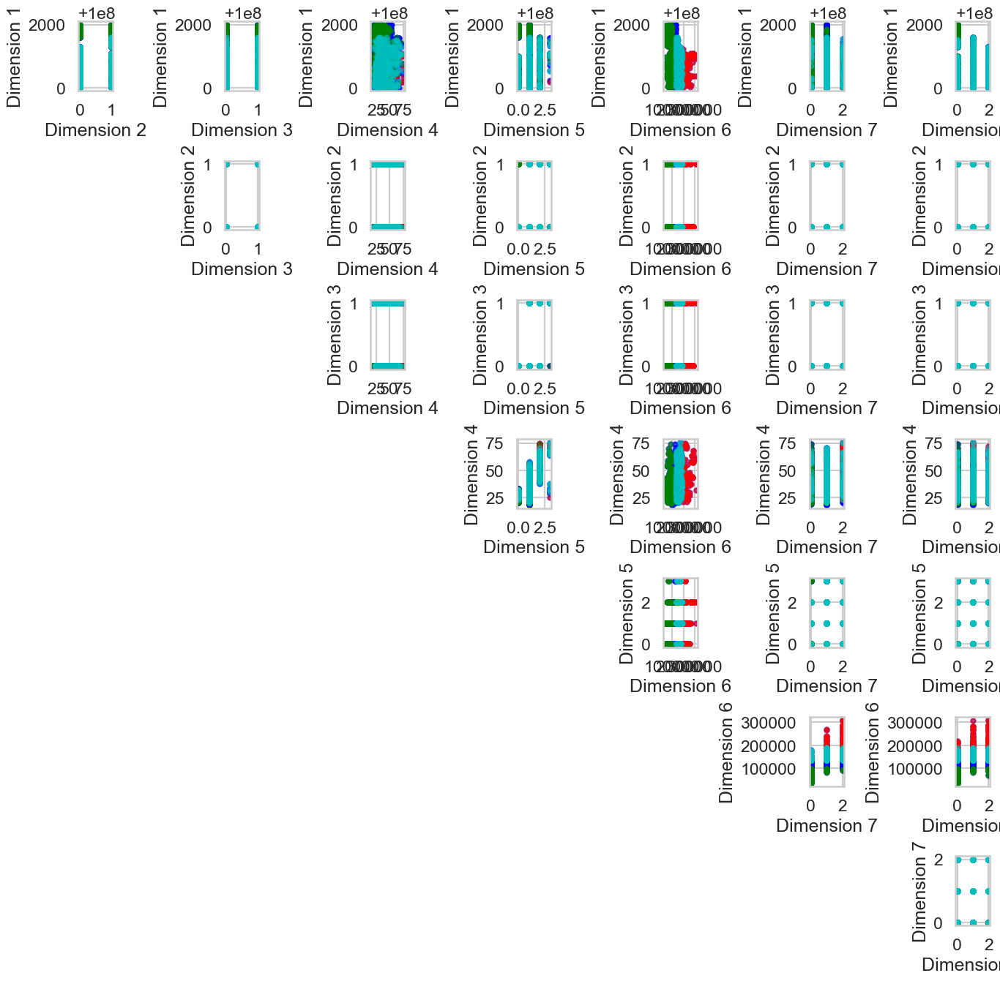

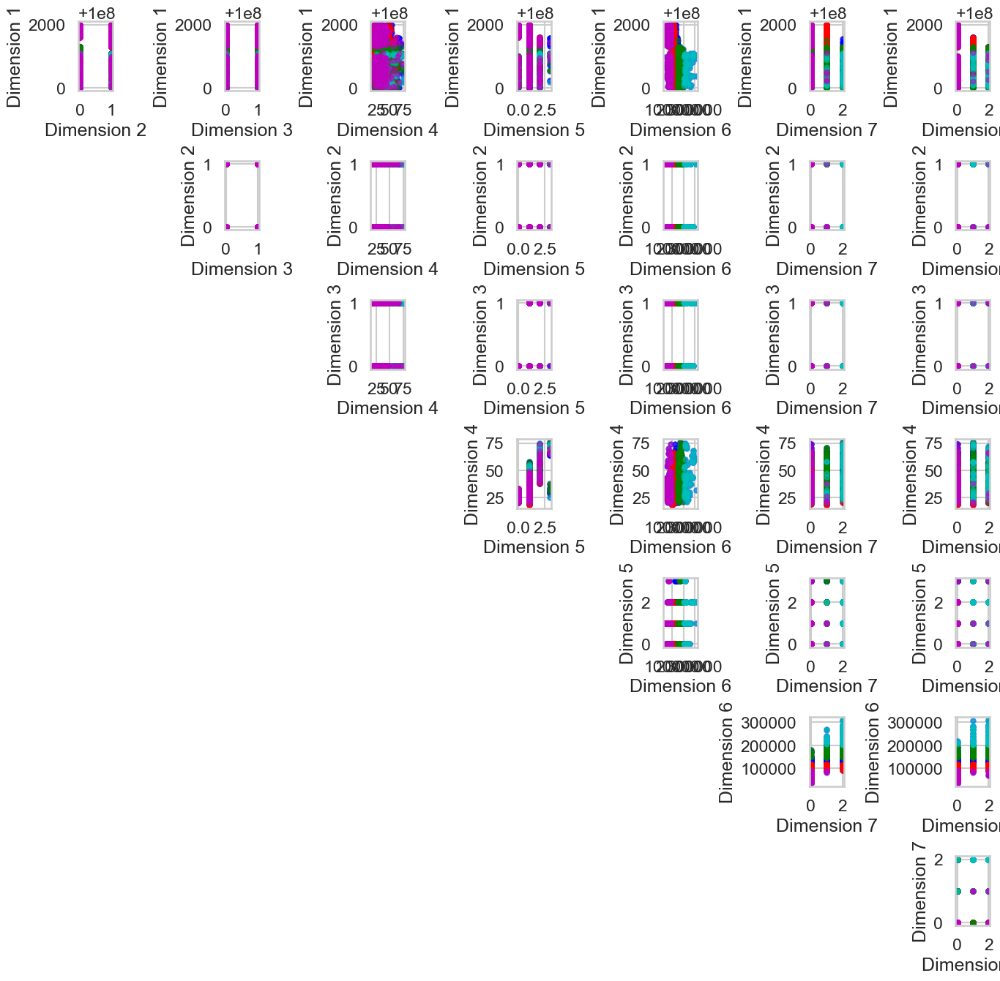

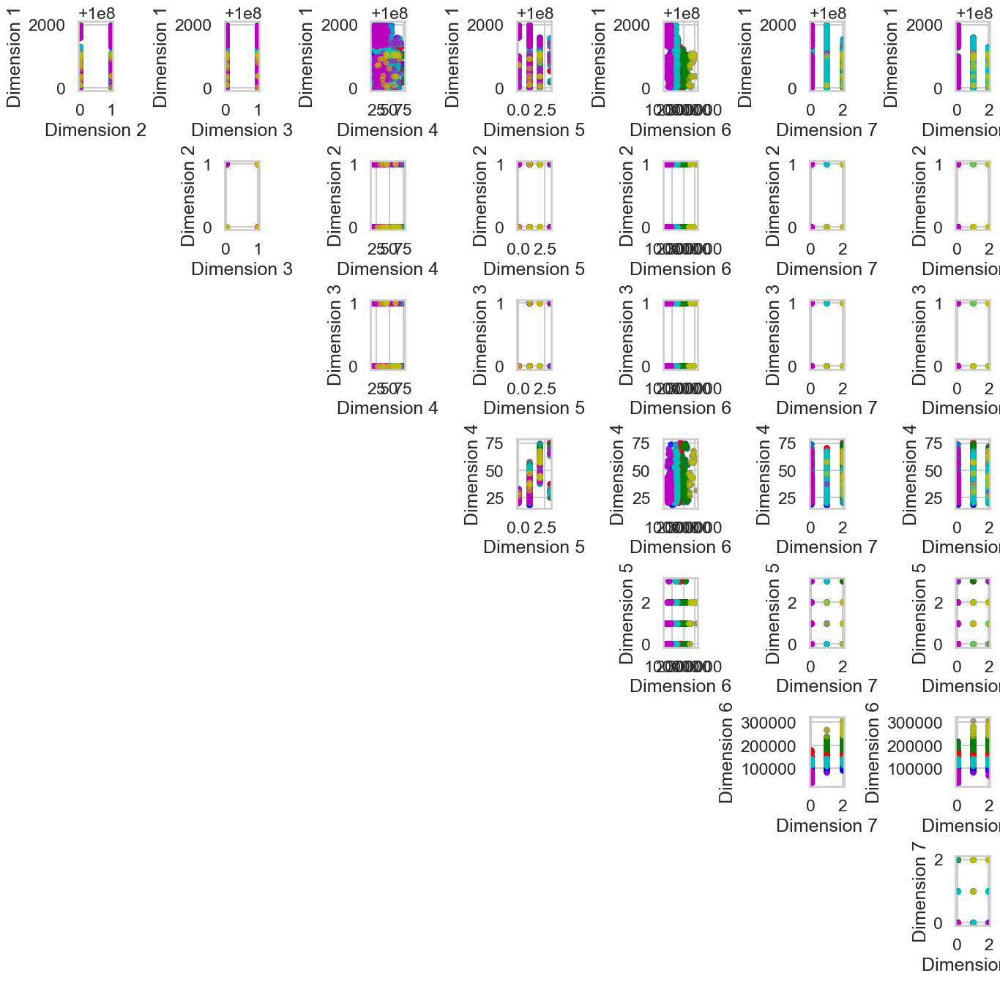

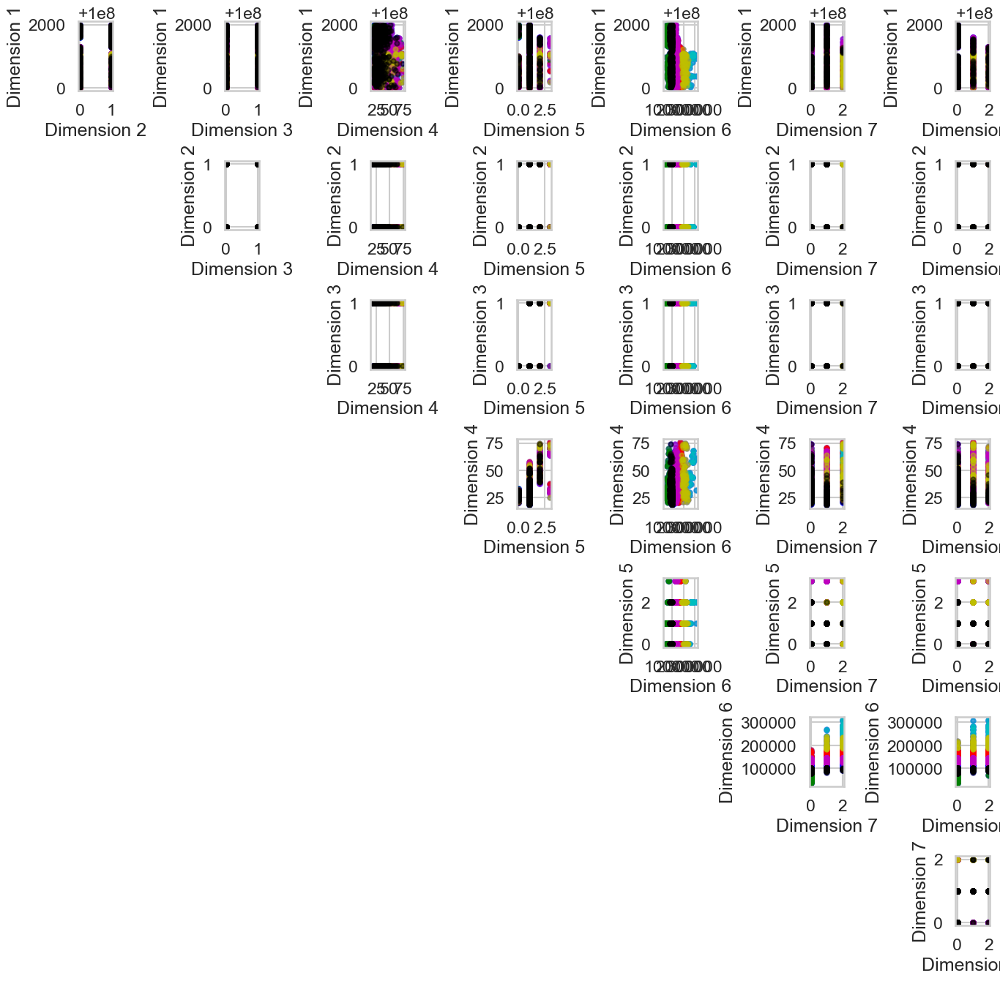

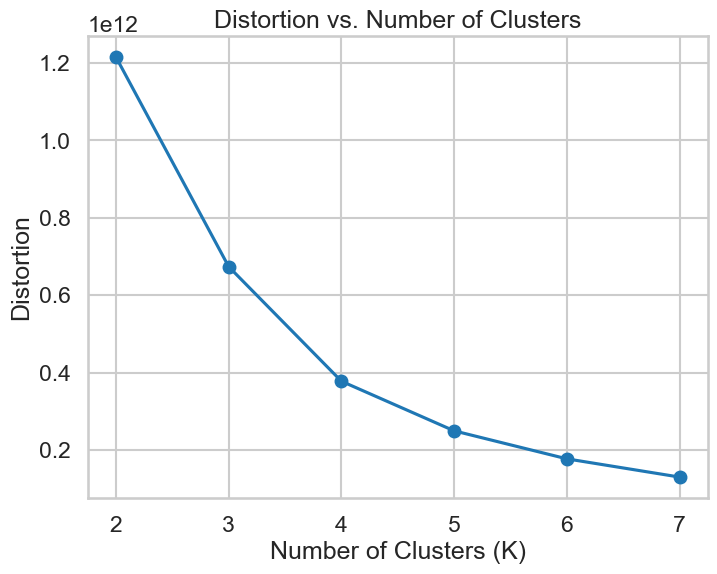

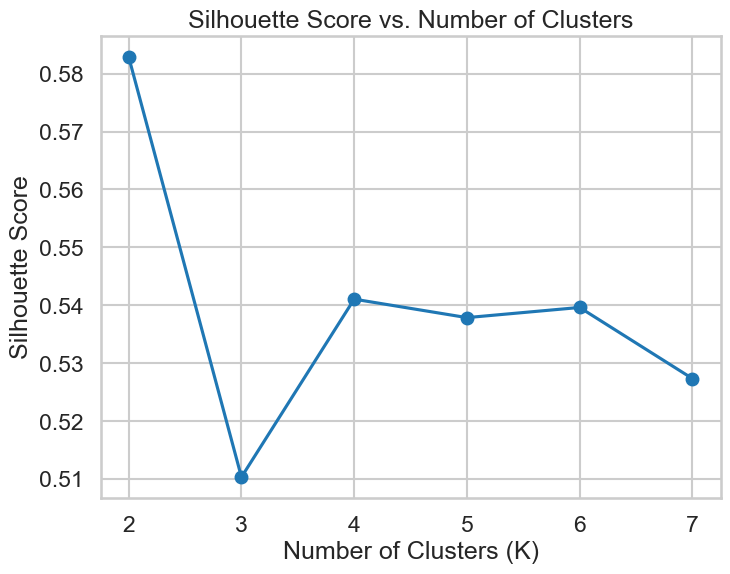

Best K: 2
Silhouette Score for Best K: 0.5828454744042129


In [23]:
#K-Means Clustering
k_values = range(2, 8)
distortions = []
silhouette_scores = []
print(k_values)
for k in range(2, 8):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(customer_data_array)
    display_cluster(customer_data_array,cluster_labels,num_clusters=k)
    distortions.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(customer_data_array, cluster_labels)
    silhouette_scores.append(silhouette_avg)
plt.figure(figsize=(8, 6))
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.xticks(k_values)
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print("Best K:", best_k)
best_silhouette_score = max(silhouette_scores)
print("Silhouette Score for Best K:", best_silhouette_score)

    


In [29]:
parameter_combinations = [
    ('euclidean', 'average', 2),
    ('euclidean', 'average', 2.5),
    ('euclidean', 'average', 3.0),
    ('euclidean', 'single', 2.0),
    ('euclidean', 'single', 2.5),
    ('euclidean', 'single', 3.0),
    ('manhattan', 'average', 2.0),
    ('manhattan', 'average', 2.5),
    ('manhattan', 'average', 3.0),
    ('manhattan', 'single', 2.0),
    ('manhattan', 'single', 2.5),
    ('manhattan', 'single', 3.0),
    ('cosine', 'average', 2.0),
    ('cosine', 'average', 2.5),
    ('cosine', 'average', 3.0),
    ('cosine', 'single', 2.0),
    ('cosine', 'single', 2.5),
    ('cosine', 'single', 3.0)
]

best_silhouette_score = -1
best_parameters = None

for affinity, linkage, distance_threshold in parameter_combinations:
    silhouette_avg_current = evaluate_agglomerative_clustering(customer_data_array, affinity, linkage, distance_threshold)

    if silhouette_avg_current < 0:
        continue
    
    if silhouette_avg_current > best_silhouette_score:
        best_silhouette_score = silhouette_avg_current
        best_parameters = (affinity, linkage, distance_threshold)

print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)
#Here the plotting of clusters is between feature one and two only in all numbers of cluters because i didnt use diplay_clutser

Best Silhouette Score: -1
Best Parameters: None


In [41]:
ps_values = np.linspace(0.1, 3, 20)
min_samples_values = np.arange(5, 26)

best_silhouette_score = -1
best_parameters = None


silhouette_scores = []


for eps in eps_values:
    for min_samples in min_samples_values:
        silhouette_avg_current = evaluate_dbscan_clustering(customer_data_array, eps, min_samples)
        
        
        if silhouette_avg_current < 0:
            continue
        elif silhouette_avg_current == -1:
            print("There is overlapping in :"[eps, min_samples])
            continue
            
        
        silhouette_scores.append((eps, min_samples, silhouette_avg_current))
        
        # Update best_cluster_labels inside the loop
        cluster_labels = compute_cluster_labels(customer_data_array, eps, min_samples)
        print(cluster_labels.shape)
        if silhouette_avg_current > best_silhouette_score:
            best_silhouette_score = silhouette_avg_current
            best_parameters = (eps, min_samples)
            best_cluster_labels = cluster_labels
if silhouette_avg_current != -1:           
    print("Best Silhouette Score:", best_silhouette_score)
    print("Best Parameters:", best_parameters)


    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_title('Silhouette Score vs. EPS and Min Samples')
    ax.set_xlabel('EPS')
    ax.set_ylabel('Min Samples')
    # Check the dimensions of the iris data
    print("Number of data points in iris dataset:", len(customer_data_array))

    # Check the dimensions of the cluster labels
    print("Number of cluster labels:", len(best_cluster_labels))
    for eps, min_samples, silhouette_avg in silhouette_scores:
        ax.scatter(eps, min_samples, c=silhouette_avg, cmap='viridis', s=50)
    cbar = plt.colorbar(ax.scatter([], [], c=[], cmap='viridis'), ax=ax, label='Silhouette Score')
    plt.show()
    plt.figure(figsize=(8, 6))
    plt.scatter(customer_data_array[:, 0], customer_data_array[:, 1], c=best_cluster_labels, cmap='viridis', alpha=0.5)
    plt.title('Best DBSCAN Clustering Result')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.colorbar(label='Cluster')
    plt.show()
    # Plot best clustering result
    display_cluster(customer_data_array, best_cluster_labels)
else:
    print("Clusters are overlapping")


Clusters are overlapping
